In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import copy
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from torch.optim.lr_scheduler import StepLR
from sklearn.metrics import mean_absolute_error,mean_squared_error,mean_absolute_percentage_error,max_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler
con = False
# Check if MPS is available
if torch.backends.mps.is_available() and con == True:
    device = torch.device("mps")
    print("GPU set")
else:
    device = torch.device("cpu")

In [2]:
def set_seed(seed):
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

class NN(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_sizes, activation, dropout_rate, batch_norm, seed):
        super(NN, self).__init__()
        if seed is not None:
            torch.manual_seed(seed)

        self.activation = activation
        self.dropout_rate = dropout_rate
        self.batch_norm = batch_norm

        layers = []
        batch_norm_layers = []

        # Input layer
        layers.append(nn.Linear(input_dim, hidden_sizes[0]))
        if batch_norm:
            batch_norm_layers.append(nn.BatchNorm1d(hidden_sizes[0]))

        # Hidden layers
        for i in range(len(hidden_sizes) - 1):
            layers.append(nn.Linear(hidden_sizes[i], hidden_sizes[i + 1]))
            if batch_norm:
                batch_norm_layers.append(nn.BatchNorm1d(hidden_sizes[i + 1]))

        # Output layer
        layers.append(nn.Linear(hidden_sizes[-1], output_dim))

        self.layers = nn.ModuleList(layers)
        self.batch_norm_layers = nn.ModuleList(batch_norm_layers) if batch_norm else None
        self.dropout = nn.Dropout(p=dropout_rate) if dropout_rate > 0 else None

        # Activation function
        if activation == 'tanh':
            self.activation_fn = nn.Tanh()
        elif activation == 'sigmoid':
            self.activation_fn = nn.Sigmoid()
        elif activation == 'relu':
            self.activation_fn = nn.ReLU()

        # Initialize weights
        self._initialize_weights()

    def _initialize_weights(self):
        for layer in self.layers:
            if isinstance(layer, nn.Linear):
                nn.init.xavier_uniform_(layer.weight)  # Xavier initialization
                nn.init.zeros_(layer.bias)  # Zero bias initialization

    def forward(self, x):
        for i, layer in enumerate(self.layers[:-1]):  
            x = layer(x)
            if self.batch_norm:
                x = self.batch_norm_layers[i](x)  # Apply Batch Normalization
            x = self.activation_fn(x)
            if self.dropout:
                x = self.dropout(x)  # Apply Dropout

        # Output layer (no activation)
        x = self.layers[-1](x)
        return x

class DynamicModel(nn.Module):
    def __init__(self, predictor, step_size):
        super(DynamicModel, self).__init__()
        self.predictor = predictor  
        self.h = step_size

    def rk4(self, x, x_hat):
        h = self.h 
        # Compute RK4 stages
        k1 = self.predictor(torch.cat((x, x_hat), dim=-1))
        k2 = self.predictor(torch.cat((x, x_hat + 0.5 * h * k1), dim=-1))
        k3 = self.predictor(torch.cat((x, x_hat + 0.5 * h * k2), dim=-1))
        k4 = self.predictor(torch.cat((x, x_hat + h * k3), dim=-1))

        # RK4 integration formula to compute the next state
        next_state = x_hat + (h / 6.0) * (k1 + 2 * k2 + 2 * k3 + k4)

        return next_state
    
    def rk4_withvar_inputs(self, x, x_hat):
        h = self.h 
        # Compute RK4 stages
        k1 = self.predictor(torch.cat((x, x_hat), dim=-1))
        k2 = self.predictor(torch.cat((x + 0.5 * h , x_hat + 0.5 * h * k1), dim=-1))
        k3 = self.predictor(torch.cat((x + 0.5 * h, x_hat + 0.5 * h * k2), dim=-1))
        k4 = self.predictor(torch.cat((x + h, x_hat + h * k3), dim=-1))

        # RK4 integration formula to compute the next state
        next_state = x_hat + (h / 6.0) * (k1 + 2 * k2 + 2 * k3 + k4)

        return next_state
    
    def adaptive_rk4(self, x, x_hat):
        h = self.h
        tolerance=1e-4
        min_step=1e-6
        max_step=1.0

        # Compute RK4 stages
        k1 = self.predictor(torch.cat((x, x_hat), dim=-1))
        k2 = self.predictor(torch.cat((x, x_hat + 0.5 * h * k1), dim=-1))
        k3 = self.predictor(torch.cat((x, x_hat + 0.5 * h * k2), dim=-1))
        k4 = self.predictor(torch.cat((x, x_hat + h * k3), dim=-1))

        # RK4 solution
        next_state_rk4 = x_hat + (h / 6.0) * (k1 + 2 * k2 + 2 * k3 + k4)

        # Compute RK5 stages (extra stage for error estimation)
        k5 = self.predictor(torch.cat((x, x_hat + h * k4), dim=-1))
        
        # RK5 solution (higher order, more accurate)
        next_state_rk5 = x_hat + (h / 6.0) * (k1 + 4 * k3 + k5)

        # Estimate local error
        error = torch.norm(next_state_rk5 - next_state_rk4, p=2)  # L2 norm of difference

        # Adjust step size based on error
        if error > tolerance and h > min_step:
            self.h = max(min_step, h * 0.5)  # Reduce step size
        elif error < tolerance / 2 and h < max_step:
            self.h = min(max_step, h * 2)  # Increase step size

        return next_state_rk4
    
    def forward(self, inputs, state):
        x = self.rk4(inputs, state)

        return x

In [3]:
def normalize_column(df, column_list, col_min, col_max, normalized_range):
    """
    Normalizes a column of a dataframe to the range [-1, 1].

    Parameters:
        df (pd.DataFrame): The input dataframe.
        column_name (str): The name of the column to normalize.
        
    Returns:
        pd.DataFrame: DataFrame with normalized column in the range [-1, 1].
    """
    for column_name in column_list:
        if normalized_range == (0, 1):
            # Normalize the column to the range [0, 1]
            df[column_name] = (df[column_name] - col_min) / (col_max - col_min)
        elif normalized_range == (-1, 1):
            # Normalize the column to the range [0, 1]
            df[column_name] = (df[column_name] - col_min) / (col_max - col_min)
        
            # Scale to the new range [-1, 1]
            df[column_name] = df[column_name] * 2 - 1
        else:
            raise ValueError("normalized_range must be either (0, 1) or (-1, 1)")
        
    return df

def denormalize(normalized_array, original_min, original_max, normalized_range):
    """
    Denormalizes a normalized array from the range [-1, 1] or [0, 1] back to the original range 
    [original_min, original_max].

    Parameters:
        normalized_array (list or np.ndarray): Multidimensional array of normalized values.
        original_min (float): The original minimum value before normalization.
        original_max (float): The original maximum value before normalization.
        normalized_range (tuple): Range used for normalization, either (0, 1) or (-1, 1).

    Returns:
        np.ndarray: A denormalized array in the original range [original_min, original_max].
    """
    # Convert to a numpy array (if not already) for easy element-wise operations
    normalized_array = np.array(normalized_array)
    
    if normalized_range == (-1, 1):
        # Denormalize from [-1, 1]
        denormalized_array = ((normalized_array + 1) / 2) * (original_max - original_min) + original_min
    elif normalized_range == (0, 1):
        # Denormalize from [0, 1]
        denormalized_array = normalized_array * (original_max - original_min) + original_min
    else:
        raise ValueError("normalized_range must be either (0, 1) or (-1, 1)")

    return denormalized_array

In [4]:
def inference_dynamicmodel(dynamicmodel, X, Y):
    """
    Perform inference on the complete dataset using the RK4 integrator model.
    
    :param rk4_integrator: The RK4 integrator model for predictions.
    :param X: Tensor of shape [num_samples, sequence_length, nx] containing input data.
    :param ny: Number of output dimensions.
    :return: Tensor of shape [num_samples, sequence_length, ny] containing predicted states.
    """
    dynamicmodel.eval()  # Set the model to evaluation mode
    
    # Initialize the state variable xn to zero
    #xn = torch.zeros(ny, dtype=torch.float32)
    state = Y[0,:].unsqueeze(0).to(device)
    
    all_predictions = []

    with torch.no_grad():  # Disable gradient computation
        for t in range(X.shape[0]):
            
            inputs = X[t, :].unsqueeze(0).to(device)
            
            # Predict the next state
            predicted_state = dynamicmodel(inputs, state)
            
            # Store the predicted state
            all_predictions.append(predicted_state)
            
            # Update state for the next time step
            state = predicted_state
        
    # Stack predictions to form the complete output tensor
    all_predictions = torch.stack(all_predictions, dim=1)  # Shape: [num_samples, sequence_length, ny]
    
    return all_predictions

def inference_sequential_training(dynamicdmodel, staticmodel, X, Y):
    """
    Perform inference on the complete dataset using the RK4 integrator model.
    
    :param rk4_integrator: The RK4 integrator model for predictions.
    :param X: Tensor of shape [num_samples, sequence_length, nx] containing input data.
    :param ny: Number of output dimensions.
    :return: Tensor of shape [num_samples, sequence_length, ny] containing predicted states.
    """
    dynamicdmodel.eval()  # Set the model to evaluation mode
    staticmodel.eval()
    
    # Initialize the state variable xn to zero
    state = Y[0,:-1].unsqueeze(0)
    
    current_predictions = []
    torque_predictions = []
    
    with torch.no_grad():  # Disable gradient computation
        for t in range(X.shape[0]):
            inputs = X[t, :].unsqueeze(0)
            speed_angle = X[t, -1].unsqueeze(0).unsqueeze(-1)
            
            predicted_current = dynamicdmodel(inputs, state)
            inputs = torch.cat([predicted_current ,speed_angle], dim=-1)
            
            predicted_torque = staticmodel(inputs)
            
            # Store the predicted state
            current_predictions.append(predicted_current)
            torque_predictions.append(predicted_torque)
            
            # Update state for the next time step
            state = predicted_current.detach()
        
    # Stack predictions to form the complete output tensor
    current_predictions = torch.stack(current_predictions, dim=1)  
    torque_predictions = torch.stack(torque_predictions, dim=1)
    
    return current_predictions, torque_predictions

def error_dynamicmodel(predictions , test_data):
    predictions = np.array(predictions)
    test_data = np.array(test_data)
    mae = np.mean(np.abs(predictions - test_data))
    mse = np.mean((predictions - test_data) ** 2)

    print(f"MAE : {mae}, MSE : {mse}")
    
def error_staticmodel(label,predictions):
    error = {}
    mean_err = mean_absolute_error(label,predictions)
    error["Mean absolute error"] = mean_err
    print(f"Mean absolute error: {mean_err}")
    
    mean_sq_err = mean_squared_error(label,predictions)
    error["Mean squared error"] = mean_sq_err
    print(f"Mean squared error: {mean_sq_err}")
    
    mean_ab_per_err = mean_absolute_percentage_error(label,predictions)
    error["Mean absolute percentage error"] = mean_ab_per_err
    print(f"Mean absolute percentage error: {mean_ab_per_err}")
        
    max_err = max_error(label,predictions)
    error["Maximum error"] = max_err
    print(f"Maximum error: {max_err}")

    return mean_err

def errormatrix(current_predictions, torque_predictions, Y_test_normalised, Y_test):
    mae, mse = error_dynamicmodel(current_predictions,  Y_test_normalised[:, :-1])
    print(f"Normalised data - Test error (MAE): {mae}, Test error (MSE): {mse}")
    current_predictions = current_predictions.squeeze(0)

    i_d = torch.tensor(denormalize(current_predictions[:, 0], -410, 20,(0,1)))
    i_q = torch.tensor(denormalize(current_predictions[:, 1], 10, 175,(0,1)))
    
    current_predictions = torch.cat((i_d.unsqueeze(-1), i_q.unsqueeze(-1)), dim=1)
    current_predictions = current_predictions.squeeze().T
    current_error_mae, mse = error_dynamicmodel(current_predictions,Y_test[:, :-1].T)
    print(f"Denormalised data - Test error (MAE): {current_error_mae}, Test error (MSE): {mse}\n")

    torque_predictions = torch.tensor(denormalize(torque_predictions, 0, 150,(0,1)),dtype=torch.float32)
    torque_predictions = torque_predictions.squeeze()
    torque_error_mae = error_staticmodel(Y_test[:, -1],torque_predictions)

    return current_predictions, torque_predictions, current_error_mae, torque_error_mae

In [5]:
def data_train(X_train, Y_train, nsim, prediction_horizon, batch_size):
    # Extract input and output data from DataFrame
    inputs = X_train
    outputs = Y_train

    X = []
    Y = []

    # Calculate the number of sequences
    num_sequences = len(X_train) // nsim
    num_sim = torch.randperm(num_sequences)[:16]
    # print(num_sim)
    
    for i in num_sim:
        # Truncate data to fit exact number of sequences
        input_sim = inputs[i*nsim : (i+1)*nsim]
        output_sim = outputs[i*nsim : (i+1)*nsim]

        # Generate random indices for the batch
        indices = torch.randperm(nsim-prediction_horizon)[:batch_size]
        
        for j in indices:
            x = input_sim[j : j+prediction_horizon]
            y = output_sim[j : j+prediction_horizon]

            X.append(x)
            Y.append(y)

    X = torch.stack(X).to(torch.float32)
    Y = torch.stack(Y).to(torch.float32)
    
    return X, Y

def data_val(X_val, Y_val, nsim, prediction_horizon, batch_size):
    # Extract input and output data from DataFrame
    inputs = X_val
    outputs = Y_val

    X = []
    Y = []

    # Calculate the number of sequences
    num_sequences = len(X_val) // nsim
    num_sim = torch.randperm(num_sequences)[:6]

    for i in num_sim :
        # Truncate data to fit exact number of sequences
        input_sim = inputs[i*nsim : (i+1)*nsim]
        output_sim = outputs[i*nsim : (i+1)*nsim]

        X.append(input_sim)
        Y.append(output_sim)

    X = torch.stack(X).to(torch.float32)
    Y = torch.stack(Y).to(torch.float32)
    
    return X, Y

def prepare_dataset_staticmodel(dynamicmodel, X, Y, nsim, batch_size):

    sequence_length = X.shape[0]//nsim
    x_train = torch.empty(0, 3)  
    y_train = torch.empty(0, 1).squeeze()

    for i in range(sequence_length):
        x = X[i*nsim : (i+1)*nsim]
        y = Y[i*nsim : (i+1)*nsim]
        current_predictions = inference_dynamicmodel(dynamicmodel, x, y)
        current = current_predictions.squeeze(0)
        speed_angle = x[:, -1].unsqueeze(-1)
        
        input = torch.concat([current,speed_angle], dim=1)
        output = y[:,-1]
        
        x_train = torch.concat([x_train,input], dim=0)
        y_train = torch.concat([y_train,output], dim=0)

    dataset = TensorDataset(x_train, y_train)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    return dataloader

In [6]:
def train_dynamicmodel(dynamicmodel, X, Y, batch_size, nsim, prediction_horizon, num_epochs, lr, early_stopping, patience):
    optimizer = optim.Adam(dynamicmodel.parameters(), lr=lr)
    loss_mse = nn.MSELoss()  
    train_mseloss_list = []
    val_mseloss_list = []

    # Hyperparameters for early stopping
    patience = patience  # Number of epochs to wait for improvement
    best_loss = float('inf')
    wait = 0  # Counter for epochs without improvement

    # Ensure data is float32
    dynamicmodel.to(torch.float32)
    try:
        for epoch in range(num_epochs):
            dynamicmodel.train()
            train_mseloss = 0
            
            batch_x, batch_y = data_train(X, Y, nsim, prediction_horizon, batch_size)
            prediction_horizon_loss = torch.tensor(0.0, requires_grad=True)
            state = batch_y[:, 0, :].to(device)
            
            # Process each time step in the batch
            for t in range(prediction_horizon-1):
                # Get current time step input
                inputs = batch_x[:, t+1, :].to(device)
                current_y = batch_y[:, t+1, :].to(device)
                
                # Predict the next state with RK4 integrator
                current_prediction = dynamicmodel(inputs, state)
                
                # Compute loss (MSE between predicted and true current values)
                loss = loss_mse(current_prediction, current_y)
                prediction_horizon_loss = prediction_horizon_loss + loss
                
                # Update state for the next time step
                state = current_prediction.detach()
            
            # Backward pass and optimization
            optimizer.zero_grad()
            prediction_horizon_loss.backward()
            optimizer.step()
                
            train_mseloss = prediction_horizon_loss.item()/(prediction_horizon)
            train_mseloss_list.append(train_mseloss)
            
            dynamicmodel.eval()
            batch_x, batch_y = data_val(X, Y, nsim, prediction_horizon, batch_size)
            total_loss = 0
            state = batch_y[:, 0, :].to(device)

            for t in range(nsim-1):
                # Get current time step input
                inputs = batch_x[:, t+1, :].to(device)
                current_y = batch_y[:, t+1, :].to(device)
                
                # Predict the next state with RK4 integrator
                current_prediction = dynamicmodel(inputs, state)
                
                # Compute loss (MSE between predicted and true current values)
                loss = loss_mse(current_prediction, current_y)
                total_loss = total_loss + loss.item()

                # Update state for the next time step
                state = current_prediction.detach()
            val_mseloss = total_loss/(nsim)
            val_mseloss_list.append(val_mseloss)
            
            print(f"Epoch {epoch + 1}/{num_epochs}, Train loss(MSE): {train_mseloss :.6f}, Validation loss(MSE): {val_mseloss :.6f}")

            if val_mseloss < best_loss:
                    best_loss = val_mseloss
                    wait = 0  # Reset the counter if improvement
                    best_weights = copy.deepcopy(dynamicmodel.state_dict())

        dynamicmodel.load_state_dict(best_weights)

    except KeyboardInterrupt:
        return train_mseloss_list, val_mseloss_list
        
    return train_mseloss_list, val_mseloss_list

def train_staticmodel(staticmodel, dataloader, epochs, lr):
    staticmodel_optimizer = optim.Adam(staticmodel.parameters(), lr=lr)
    loss_mse = nn.MSELoss()
    staticmodel_loss_list = []
    print(len(dataloader))
    try:
        for epoch in range(epochs):
            staticmodel.train()
            batch_loss = 0
            for x, y in dataloader:
                y = y.unsqueeze(-1)
                torque_predictions = staticmodel(x)
                loss = loss_mse(torque_predictions, y)

                staticmodel_optimizer.zero_grad()
                loss.backward()
                staticmodel_optimizer.step()

                batch_loss += loss.item()
            train_loss = batch_loss/len(dataloader)
            staticmodel_loss_list.append(train_loss)

            print(f"Epoch {epoch + 1}/{epochs}, Static model MSE loss: {train_loss :.6f}")
    except KeyboardInterrupt:
        return staticmodel_loss_list
    
    return staticmodel_loss_list

In [7]:
def plot_losses(train_mseloss_list, val_mseloss_list):
    _, axs = plt.subplots(2,1,figsize=(6,10))
    axs[0].plot(train_mseloss_list, label = "Train loss")
    axs[1].plot(val_mseloss_list, label="Val loss")
    axs[0].set_title("Prediction horizon loss")
    axs[0].set_xlabel("Number of epochs")
    axs[0].set_ylabel("MSE loss")
    axs[0].legend()

    plt.show()

def plot_predictions(X_test, Y_test, current_predictions):
   
    _, axs = plt.subplots(3,1, figsize=(8,6))
    axs[0].plot(X_test[:,0], label = 'V_d')
    axs[0].plot(X_test[:,1], label = 'V_q')
    axs[0].legend()
    
    axs[1].plot(Y_test[:,0], label = 'i_d')
    axs[1].plot(current_predictions[:,0], label = 'i_d pred')
    axs[1].legend()

    axs[2].plot(Y_test[:,1], label = 'i_q')
    axs[2].plot(current_predictions[:,1], label = 'i_q pred')
    axs[2].legend()

    plt.tight_layout()
    plt.show()

def plot_heatmap_with_values(x_list, x_label, y_list, y_label, values_list, value_label, cmap='viridis'):
    """
    Plots a heatmap using seaborn from three lists: x-coordinates, y-coordinates, and values.
    Values are displayed in each box, and a grid structure is added.

    Parameters:
        x_list (list or array): List of x-coordinates.
        y_list (list or array): List of y-coordinates.
        values_list (list or array): List of values corresponding to each (x, y) pair.
        x_label (str): Label for the x-axis.
        y_label (str): Label for the y-axis.
        value_label (str): Label for the colorbar and title.
        cmap (str): Colormap for the heatmap. Default is 'viridis'.
    
    Returns:
        None: Displays the heatmap.
    """
    # Create a DataFrame from the input lists
    data = pd.DataFrame({'x': x_list, 'y': y_list, 'value': values_list})
    
    # Pivot the DataFrame to create a 2D grid
    heatmap_data = data.pivot(index='y', columns='x', values='value')
    
    # Plot the heatmap
    plt.figure(figsize=(12, 10))
    sns.heatmap(
        heatmap_data, 
        cmap=cmap, 
        annot=True,  # Display values in each box
        fmt=".1f",  # Format for the annotations
        linewidths=0.5,  # Add grid lines
        linecolor='black',  # Color of grid lines
        cbar_kws={'label': value_label}  # Add label to colorbar
    )
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(value_label)
    plt.show()

def plot_binned_heatmap(x_list, x_label, y_list, y_label, values_list, value_label, bins_x=5, bins_y=5, cmap='viridis'):
    """
    Plots a heatmap using seaborn with binned x and y values. Bin ranges are shown on both axes.
    
    Parameters:
        x_list (list or array): List of x-coordinates.
        y_list (list or array): List of y-coordinates.
        values_list (list or array): List of values corresponding to each (x, y) pair.
        x_label (str): Label for the x-axis.
        y_label (str): Label for the y-axis.
        value_label (str): Label for the colorbar and title.
        bins_x (int): Number of bins for the x-axis.
        bins_y (int): Number of bins for the y-axis.
        cmap (str): Colormap for the heatmap. Default is 'viridis'.
    
    Returns:
        None: Displays the heatmap.
    """
    # Create bins for x and y values
    x_bins = np.linspace(min(x_list), max(x_list), bins_x + 1)
    y_bins = np.linspace(min(y_list), max(y_list), bins_y + 1)
    
    # Digitize x and y values into bins
    x_bin_indices = np.digitize(x_list, x_bins, right=True)
    y_bin_indices = np.digitize(y_list, y_bins, right=True)
    
    # Create bin labels (ranges)
    x_bin_labels = [f'[{x_bins[i]:.1f}, {x_bins[i+1]:.1f}]' for i in range(len(x_bins)-1)]
    y_bin_labels = [f'[{y_bins[i]:.1f}, {y_bins[i+1]:.1f}]' for i in range(len(y_bins)-1)]
    
    # Create a DataFrame
    data = pd.DataFrame({'x_bin': x_bin_indices, 'y_bin': y_bin_indices, 'value': values_list})
    
    # Aggregate data by mean (or sum, depending on preference)
    heatmap_data = data.groupby(['y_bin', 'x_bin'])['value'].mean().unstack()
    
    # Ensure heatmap_data includes all bins
    heatmap_data = heatmap_data.reindex(index=range(1, bins_y+1), columns=range(1, bins_x+1), fill_value=np.nan)
    
    # Set bin labels as index/columns
    heatmap_data.index = y_bin_labels[:len(heatmap_data)]
    heatmap_data.columns = x_bin_labels[:len(heatmap_data.columns)]
    
    # Plot the heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        heatmap_data, 
        cmap=cmap, 
        annot=True,  # Display values in each box
        fmt=".1f",  # Format for the annotations
        linewidths=0.5,  # Add grid lines
        linecolor='black',  # Color of grid lines
        cbar_kws={'label': value_label}  # Add label to colorbar
    )
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(value_label)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.show()

In [8]:
def abc_to_dq(V_a, V_b, V_c, theta):
    """
    Convert three-phase voltage (V_a, V_b, V_c) to dq frame using Park transformation.
    :param V_a: Phase A voltage
    :param V_b: Phase B voltage
    :param V_c: Phase C voltage
    :param theta: Rotor angle in radians
    :return: v_d, v_q
    """
    d = (2/3) * (V_a * np.cos(theta) + V_b * np.cos(theta - 2*np.pi/3) + V_c * np.cos(theta + 2*np.pi/3))
    q = -(2/3) * (V_a * np.sin(theta) + V_b * np.sin(theta - 2*np.pi/3) + V_c * np.sin(theta + 2*np.pi/3))
    return d, q

In [46]:
# Parameters for Dynamic model
ts = 0.00025 
nsim = 40000
prediction_horizon = 5000
batch_size_dy = 8
num_epochs_dy = 2000 
lr_dy = 0.001
early_stoping = True
patience = 500

# Parameters for Static models 
batch_size_st = 256 
num_epochs_st = 1000 
lr_st = 0.001


In [26]:
# df = pd.read_hdf('/Users/chiragangadi/Uni Siegen/WHB_IAS/02_Data/Updated dataset/train_dataset.h5', key='table')

# df["theta"] = np.radians(df['Phi_el []'])
# # Convert to dq frame
# df[['V_d', 'V_q']] = df.apply(lambda row: abc_to_dq(row['VM9.V [V]'], row['VM7.V [V]'], row['VM8.V [V]'], row["theta"]), axis=1, result_type='expand')
# df[['I_d', 'I_q']] = df.apply(lambda row: abc_to_dq(row['i_a'], row['i_b'], row['i_c'], row["theta"]), axis=1, result_type='expand')

# df = df.reset_index(drop=True)

In [27]:
# df.to_hdf('/Users/chiragangadi/Uni Siegen/WHB_IAS/02_Data/Updated dataset/train_dataset_1.h5', key='table')

In [28]:
train_data = pd.read_hdf('/Users/chiragangadi/Uni Siegen/WHB_IAS/02_Data/Updated dataset/train_dataset.h5', key='table')

input_scaler = MinMaxScaler()
output_scaler = MinMaxScaler()

# X_train = torch.tensor(input_scaler.fit_transform(train_data[['V_d', 'V_q', 'Speed']]), dtype=torch.float16)
# Y_train = torch.tensor(output_scaler.fit_transform(train_data[['I_d','I_q']]), dtype=torch.float16)

X_train = torch.tensor(train_data[['u_d', 'u_q', 'Speed']].values, dtype=torch.float16)
Y_train = torch.tensor(train_data[['i_d','i_q']].values, dtype=torch.float16)

#########################################################################################################################################

test_data = pd.read_hdf('/Users/chiragangadi/Uni Siegen/WHB_IAS/02_Data/Updated dataset/train_dataset.h5', key='table')

# X_test = torch.tensor(input_scaler.fit_transform(train_data[['V_d', 'V_q', 'Speed']]), dtype=torch.float16)

X_test = torch.tensor(train_data[['u_d', 'u_q', 'Speed']].values, dtype=torch.float16)
Y_test = torch.tensor(test_data[['i_d', 'i_q']].values, dtype=torch.float32)

###############################################################################

input_cols = ['u_d','u_q', 'Speed']
output_cols = ['i_d','i_q']

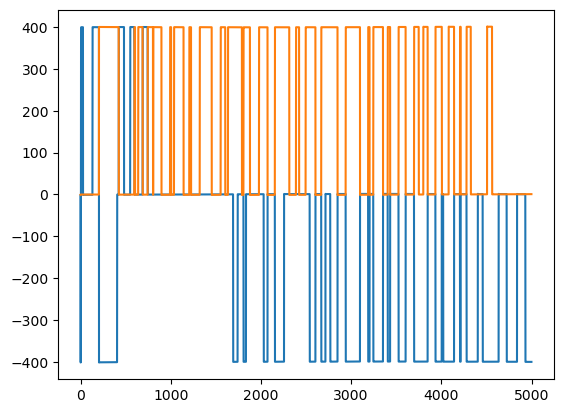

In [22]:
plt.plot(train_data['VM9.V [V]'][:5000])
plt.plot(train_data['VM7.V [V]'][:5000])
plt.show()

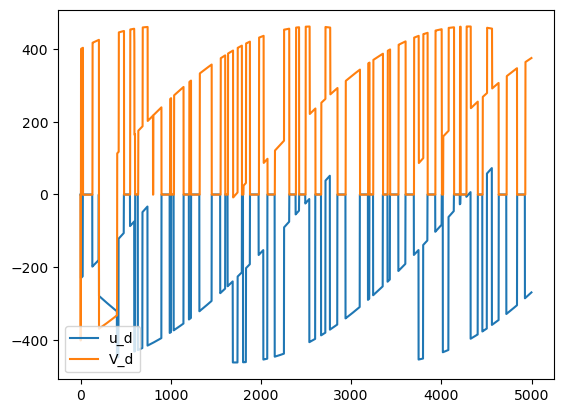

In [25]:
plt.plot(train_data['u_d'][:5000], label='u_d')
plt.plot(train_data['V_d'][:5000], label='V_d')
plt.legend()
plt.show()

In [47]:
# Instantiate the neural network predictor
neuralnet = NN(input_dim=5, output_dim=2, hidden_sizes=[64,64], activation='relu', dropout_rate=0, batch_norm=False, seed=23).to(device)

# Instantiate the RK4 integrator with the neural network
dynamicmodel = DynamicModel(neuralnet, ts)

#train_mseloss_list, val_mseloss_list = train_dynamicmodel(dynamicmodel, trainloader, X_val, Y_val, nsim, prediction_horizon, num_epochs_dy, lr_dy, early_stoping, patience)
train_mseloss_list, val_mseloss_list = train_dynamicmodel(dynamicmodel, X_train, Y_train, batch_size_dy, nsim, prediction_horizon, num_epochs_dy, lr_dy, early_stoping, patience)

Epoch 1/2000, Train loss(MSE): 151791.155200, Validation loss(MSE): 1853511.976705
Epoch 2/2000, Train loss(MSE): 71643.526400, Validation loss(MSE): 620493.533489
Epoch 3/2000, Train loss(MSE): 21023.329600, Validation loss(MSE): 116414.865065
Epoch 4/2000, Train loss(MSE): 3031.637600, Validation loss(MSE): 97181.413692
Epoch 5/2000, Train loss(MSE): 4889.825200, Validation loss(MSE): 315396.424502
Epoch 6/2000, Train loss(MSE): 16722.560000, Validation loss(MSE): 522377.638855
Epoch 7/2000, Train loss(MSE): 28434.505600, Validation loss(MSE): 540622.506929
Epoch 8/2000, Train loss(MSE): 35750.230400, Validation loss(MSE): 630672.893742
Epoch 9/2000, Train loss(MSE): 33026.876800, Validation loss(MSE): 470372.426699
Epoch 10/2000, Train loss(MSE): 28808.841600, Validation loss(MSE): 371939.374873
Epoch 11/2000, Train loss(MSE): 19882.868800, Validation loss(MSE): 217116.814826
Epoch 12/2000, Train loss(MSE): 7574.689600, Validation loss(MSE): 79512.679017
Epoch 13/2000, Train loss(MS

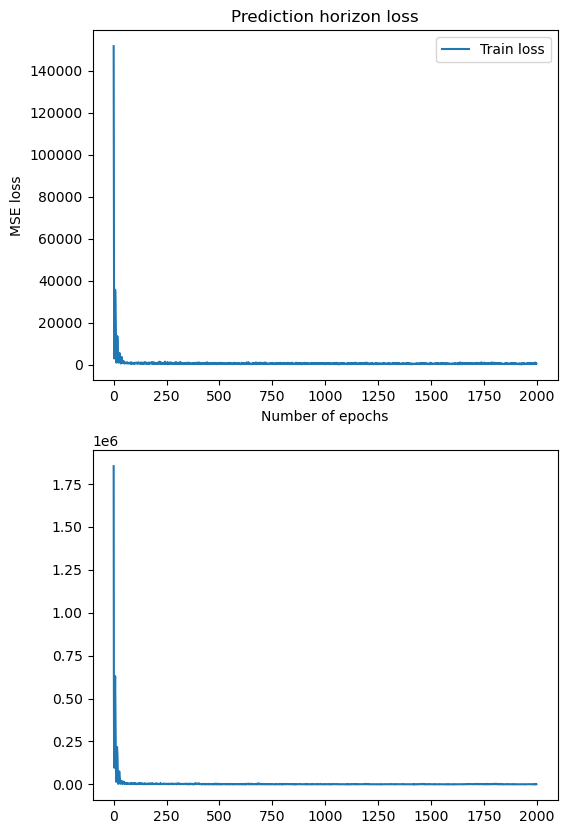

In [48]:
plot_losses(train_mseloss_list, val_mseloss_list)

MAE : 11.56407642364502, MSE : 315.9726867675781


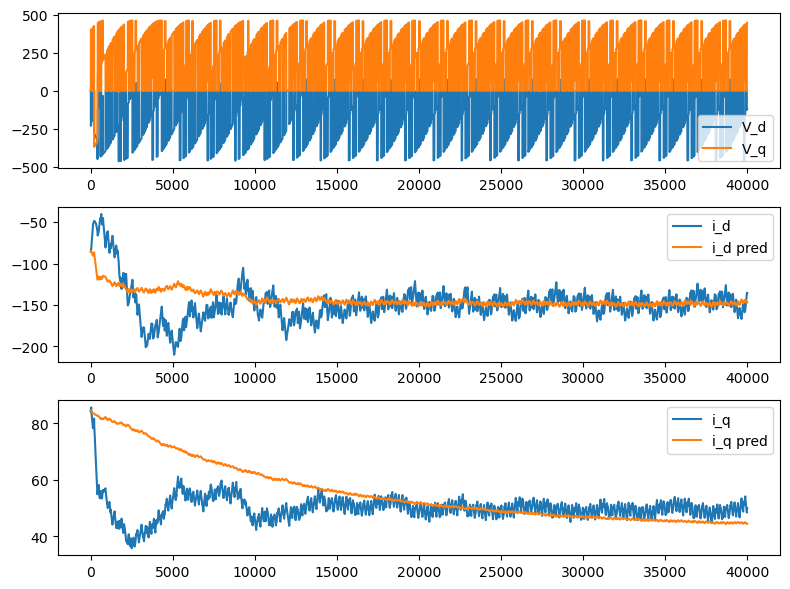

MAE : 10.475802421569824, MSE : 348.67767333984375


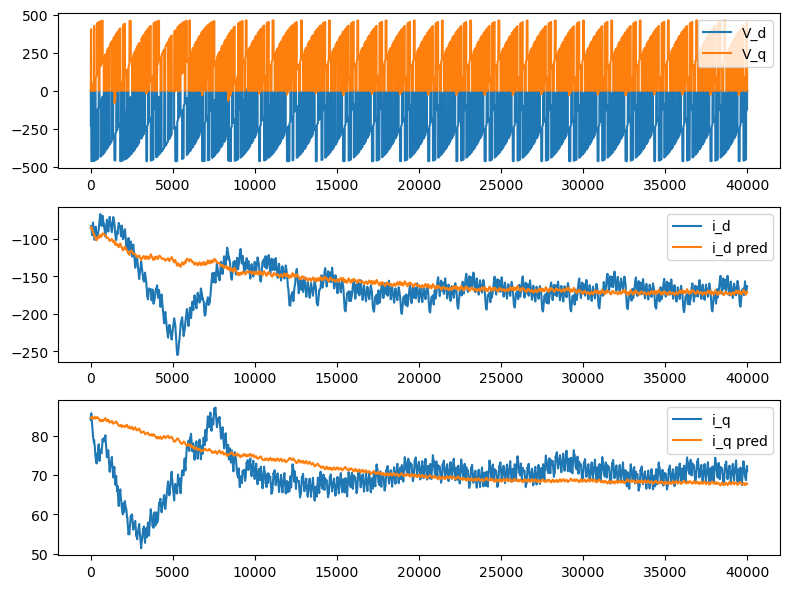

MAE : 20.35626792907715, MSE : 910.7075805664062


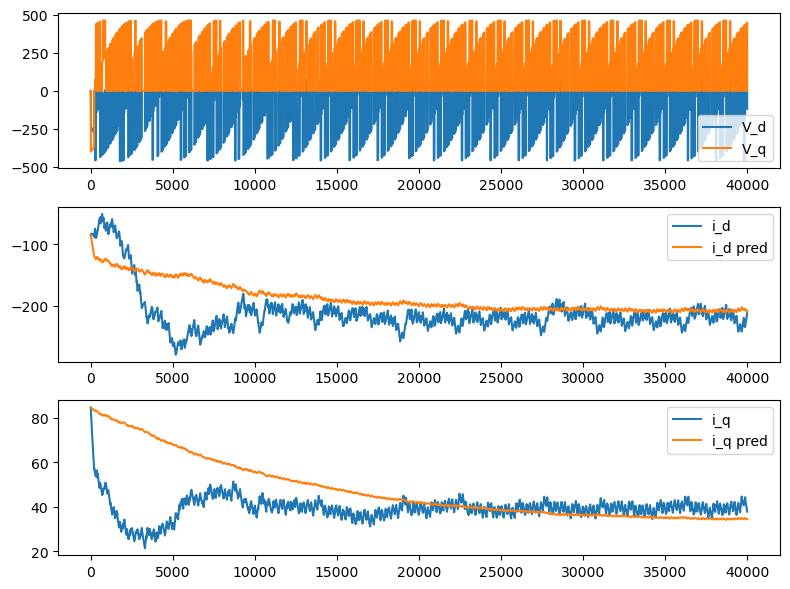

MAE : 14.497370719909668, MSE : 459.33489990234375


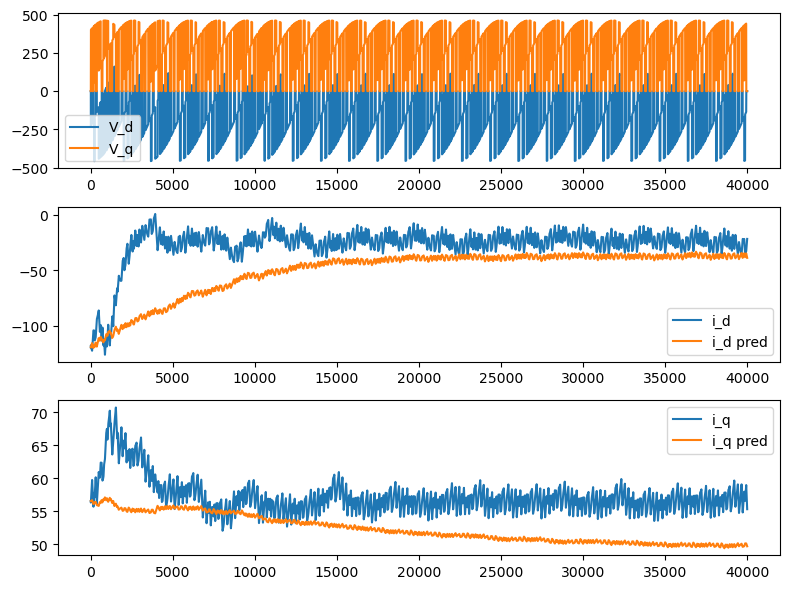

MAE : 29.058359146118164, MSE : 2264.99658203125


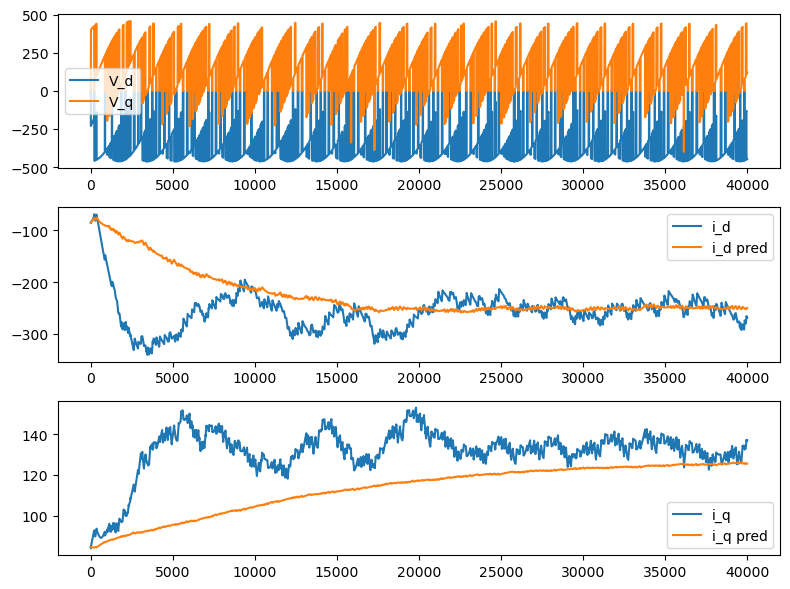

MAE : 35.21491241455078, MSE : 3067.586669921875


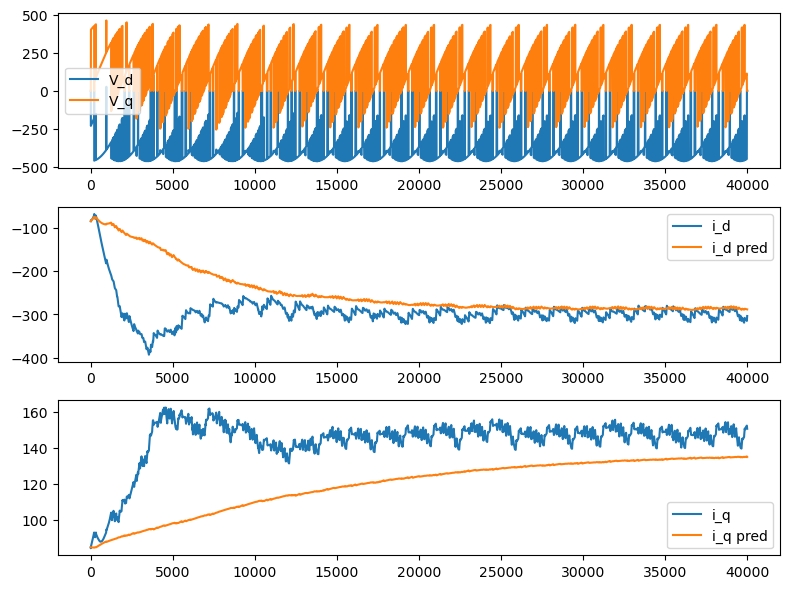

MAE : 25.822187423706055, MSE : 2159.371826171875


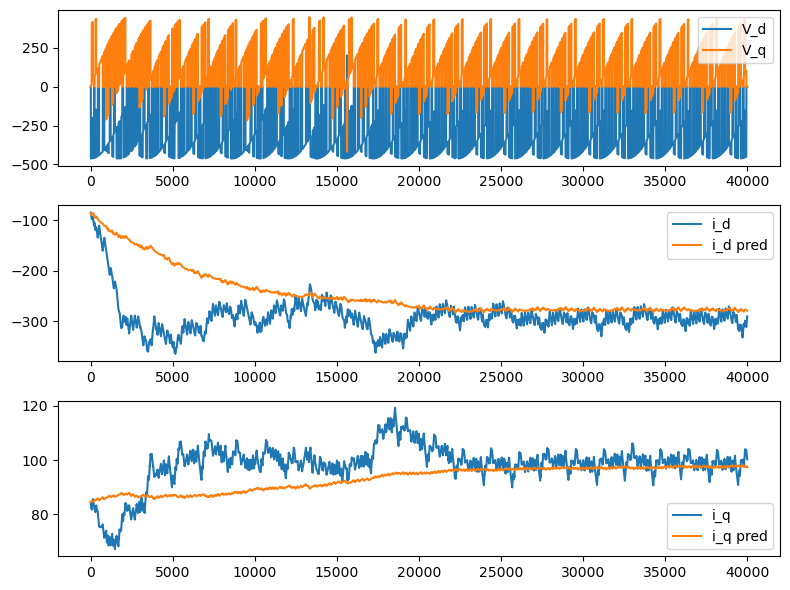

MAE : 7.506303787231445, MSE : 116.66081237792969


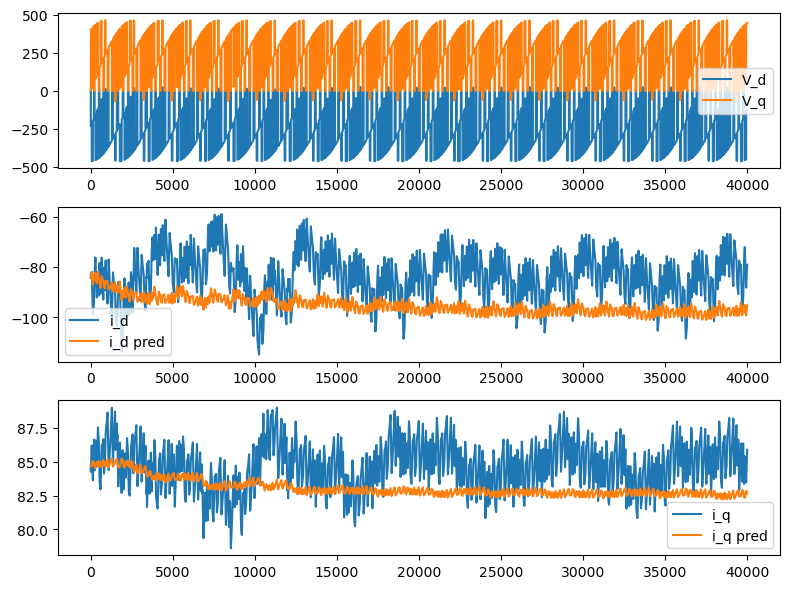

MAE : 14.019739151000977, MSE : 409.9012145996094


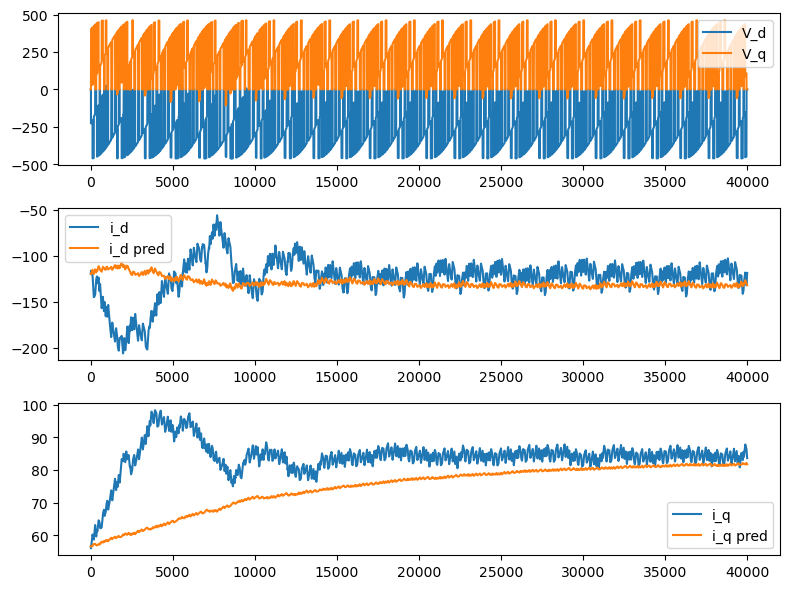

MAE : 9.793646812438965, MSE : 195.8626251220703


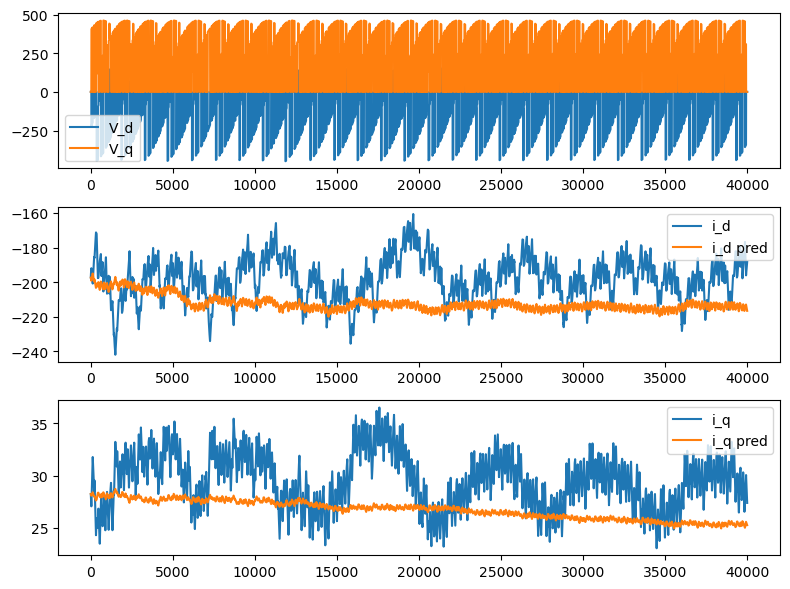

MAE : 17.47473907470703, MSE : 663.0814208984375


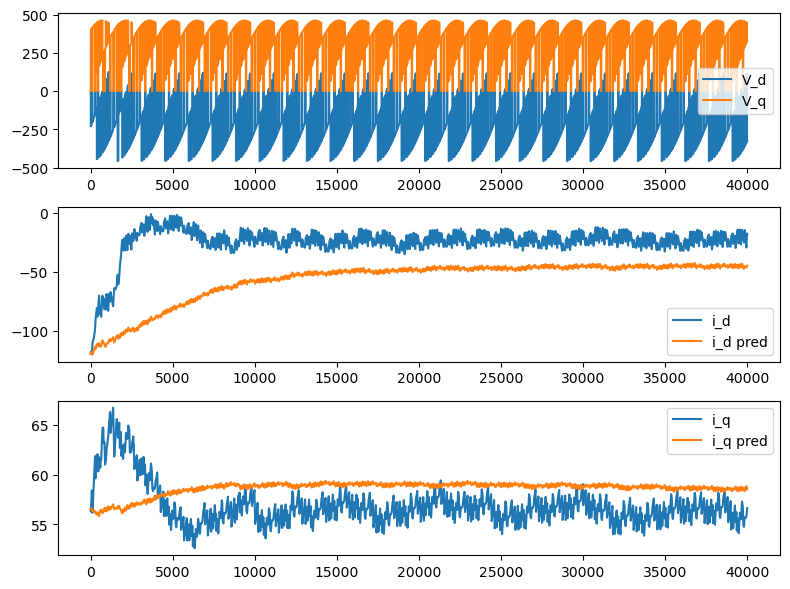

MAE : 19.108238220214844, MSE : 760.58447265625


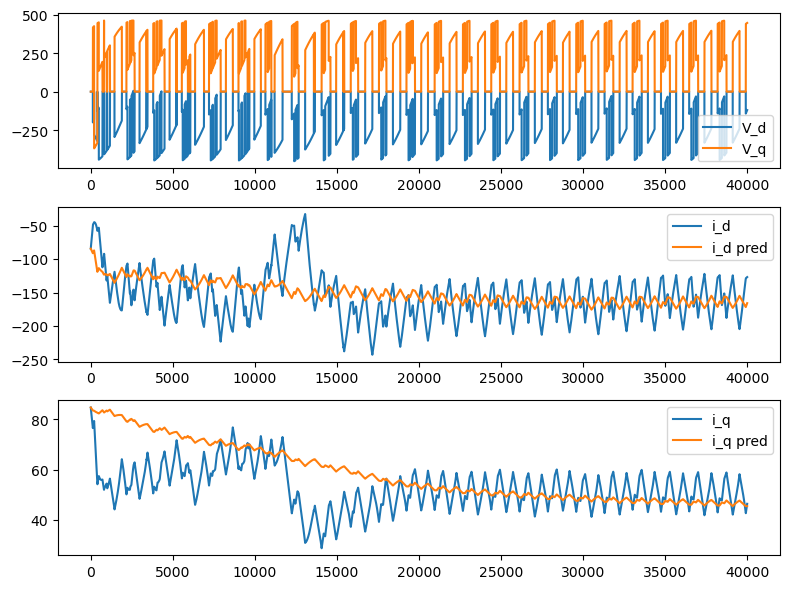

MAE : 18.403976440429688, MSE : 1033.7236328125


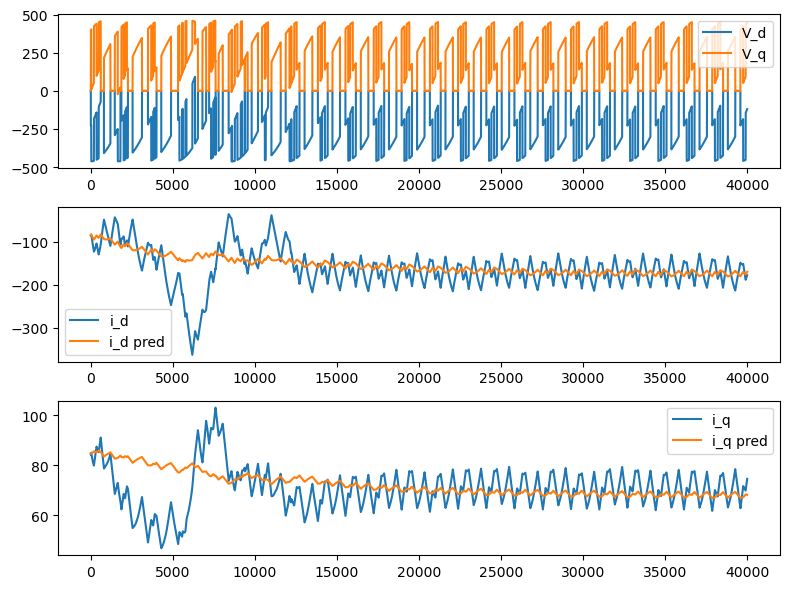

MAE : 15.041069984436035, MSE : 468.6541442871094


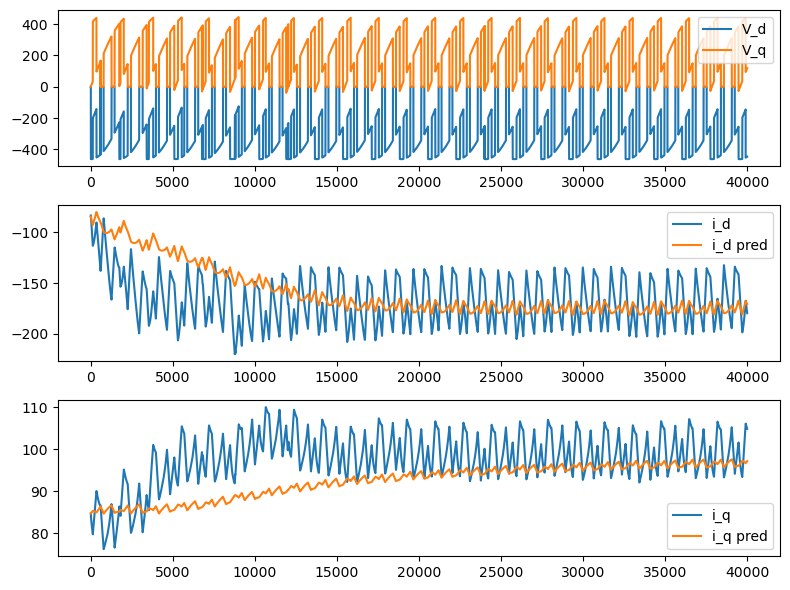

MAE : 23.822370529174805, MSE : 1207.5340576171875


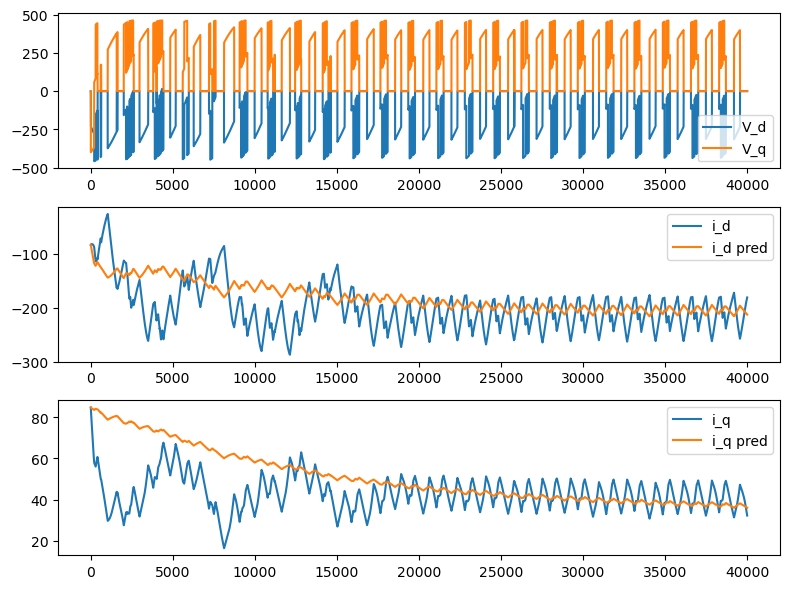

MAE : 16.574748992919922, MSE : 606.3145751953125


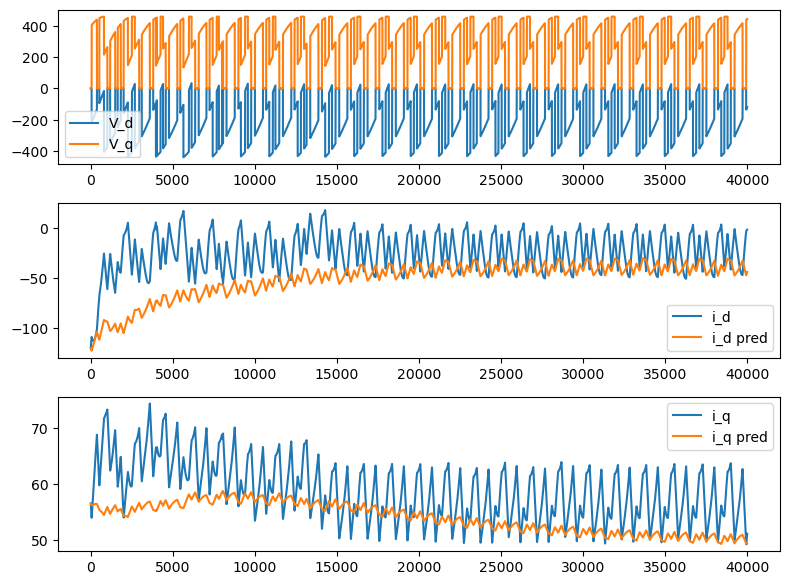

MAE : 22.045703887939453, MSE : 1171.7298583984375


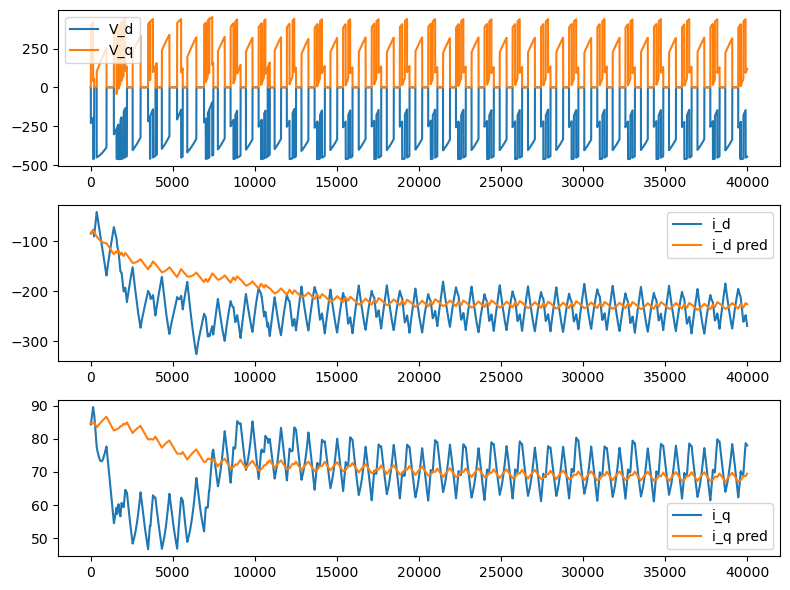

MAE : 26.17078971862793, MSE : 1957.533203125


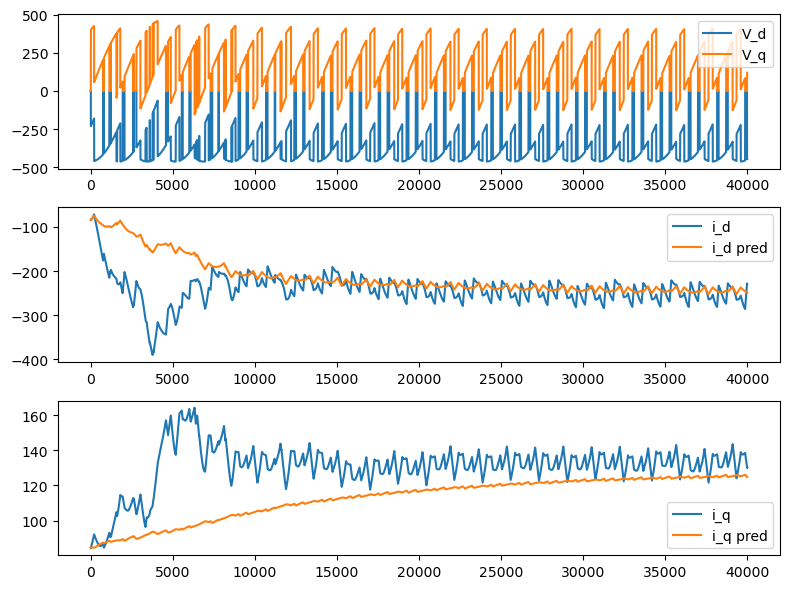

MAE : 30.409374237060547, MSE : 2848.51123046875


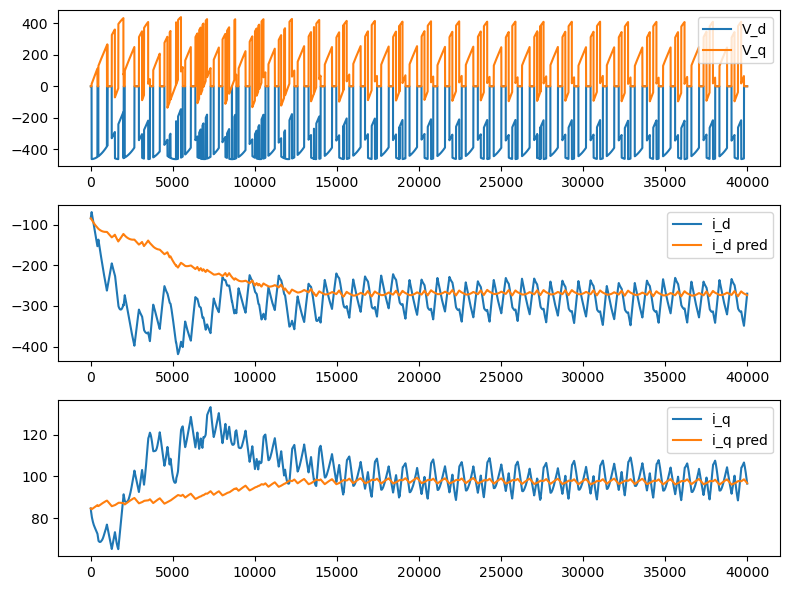

MAE : 18.111835479736328, MSE : 661.5689697265625


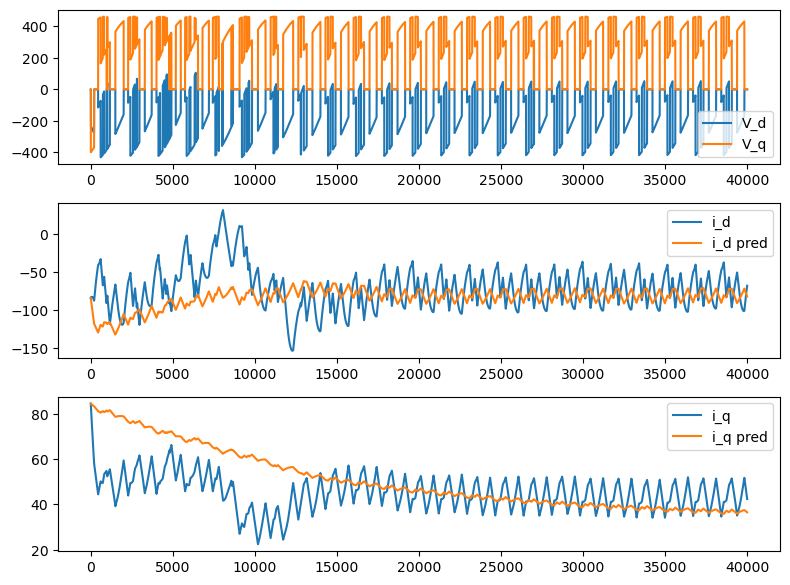

In [50]:
for i in range(20):
    x_test = X_test[i*nsim : (i+1)*nsim]
    y_test = Y_test[i*nsim : (i+1)*nsim]
    
    current_predictions = inference_dynamicmodel(dynamicmodel, x_test, y_test)
    current_predictions = current_predictions.squeeze(0)
    # current_predictions = output_scaler.inverse_transform(current_predictions)
    error_dynamicmodel(current_predictions, y_test)

    plot_predictions(x_test, y_test, current_predictions)


MAE : 13.847188949584961, MSE : 431.806396484375


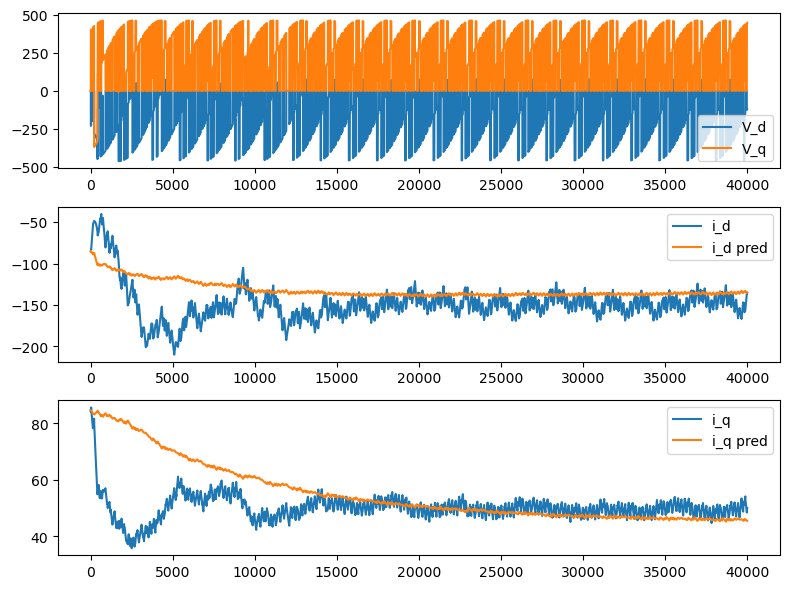

MAE : 16.432518005371094, MSE : 693.193115234375


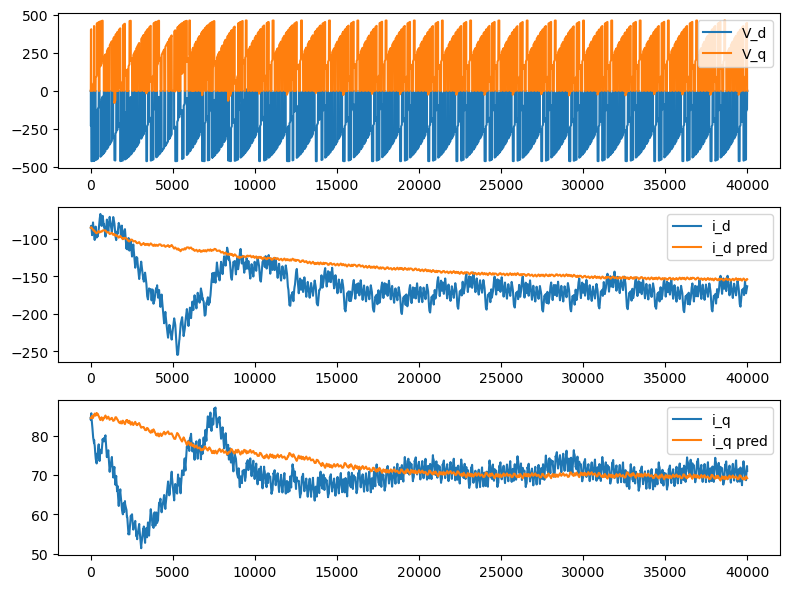

MAE : 27.206819534301758, MSE : 1450.06787109375


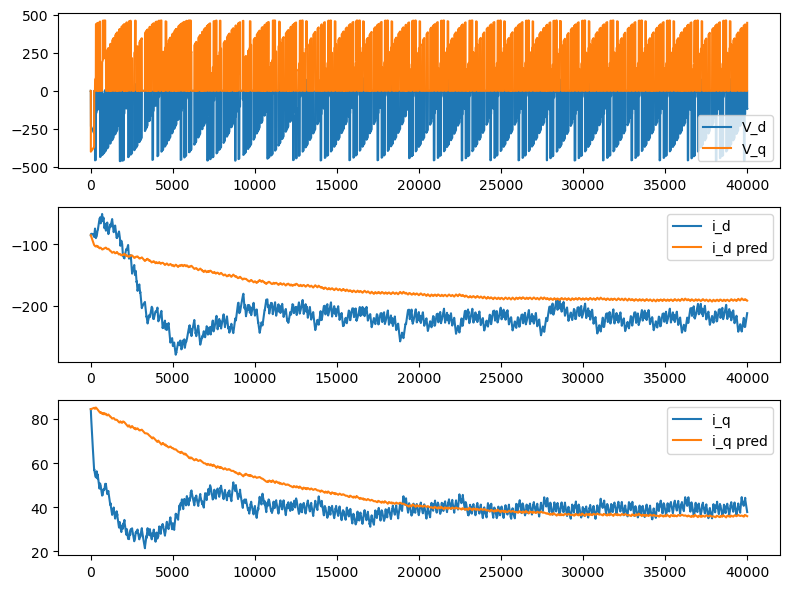

MAE : 15.201057434082031, MSE : 625.8951416015625


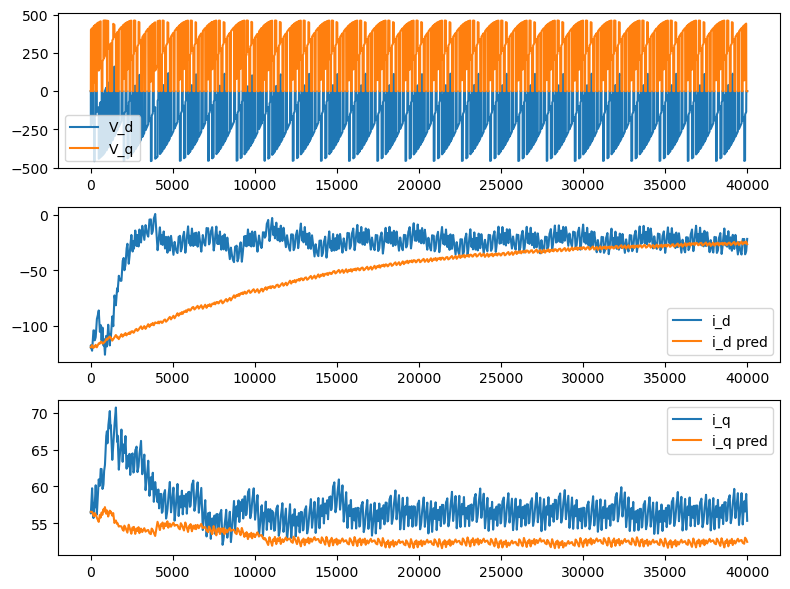

MAE : 44.08319091796875, MSE : 4587.06103515625


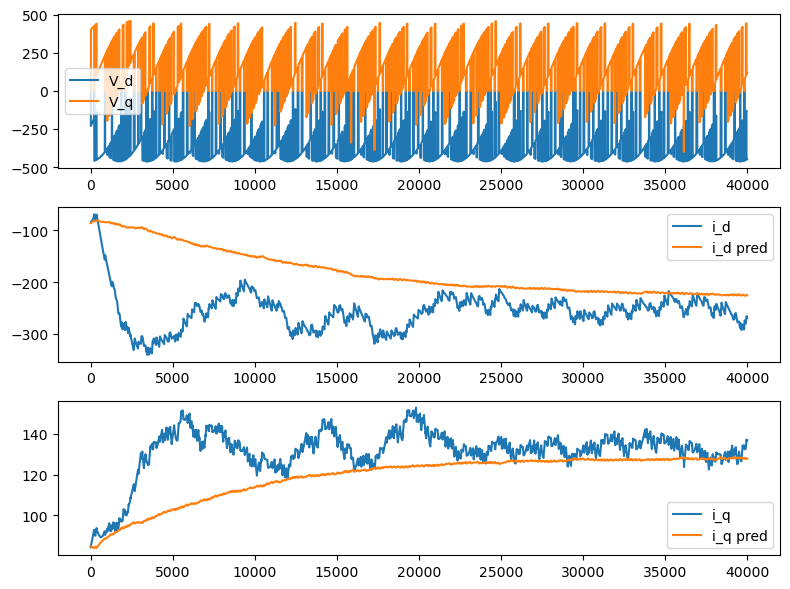

MAE : 56.781898498535156, MSE : 6466.8876953125


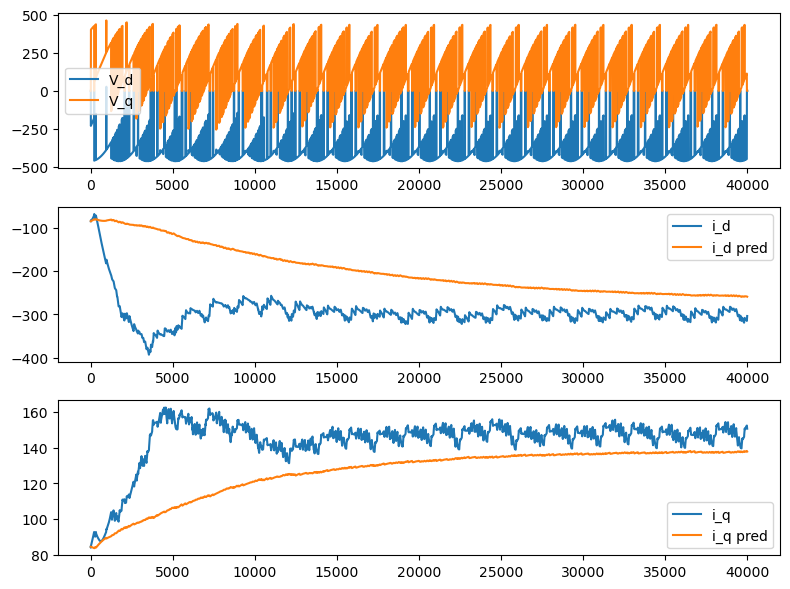

MAE : 43.489742279052734, MSE : 4779.46240234375


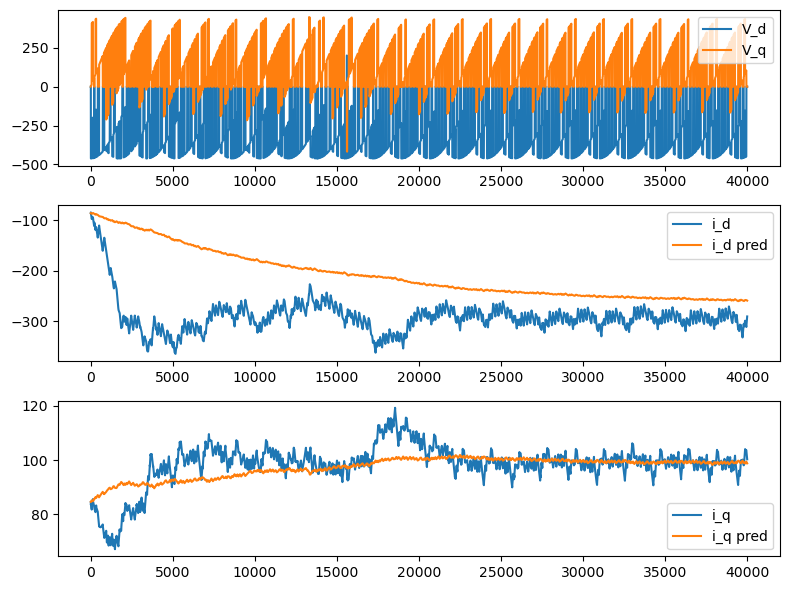

MAE : 4.297466278076172, MSE : 43.39971923828125


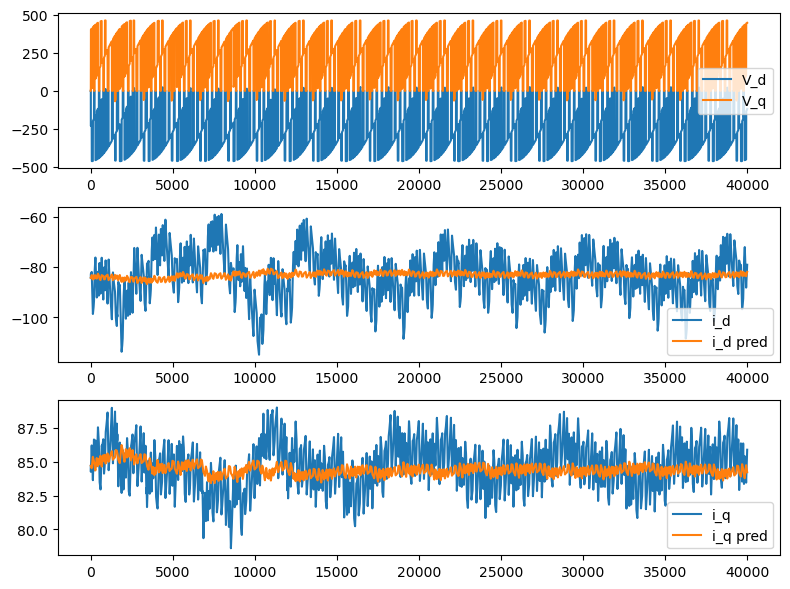

MAE : 11.576523780822754, MSE : 360.6290588378906


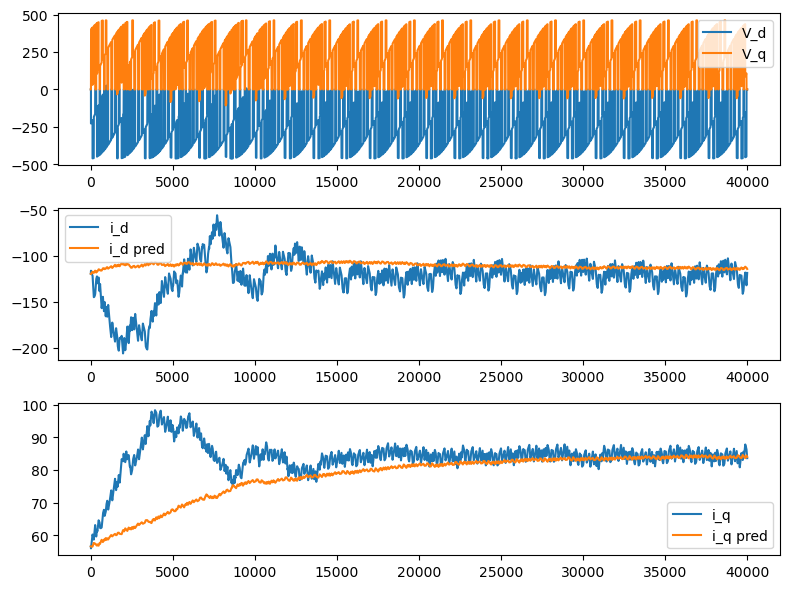

MAE : 6.573007583618164, MSE : 95.09493255615234


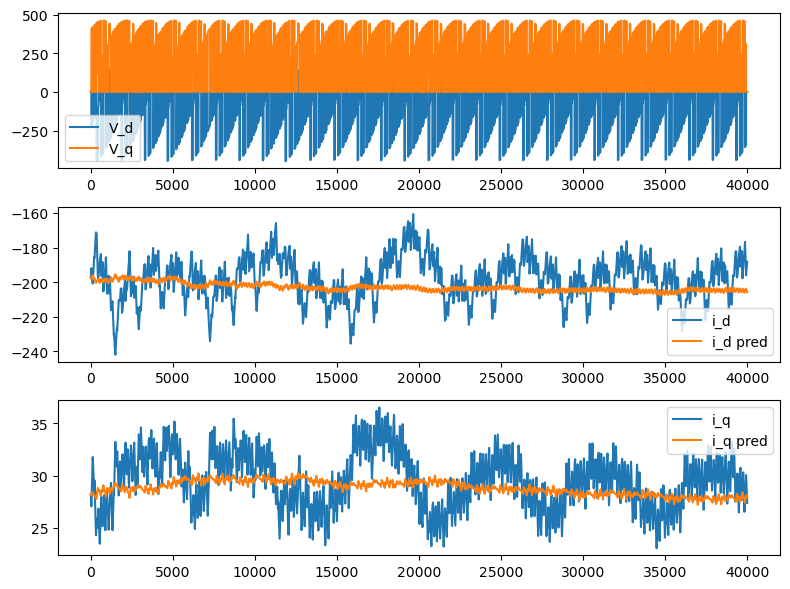

MAE : 16.70418357849121, MSE : 696.4677734375


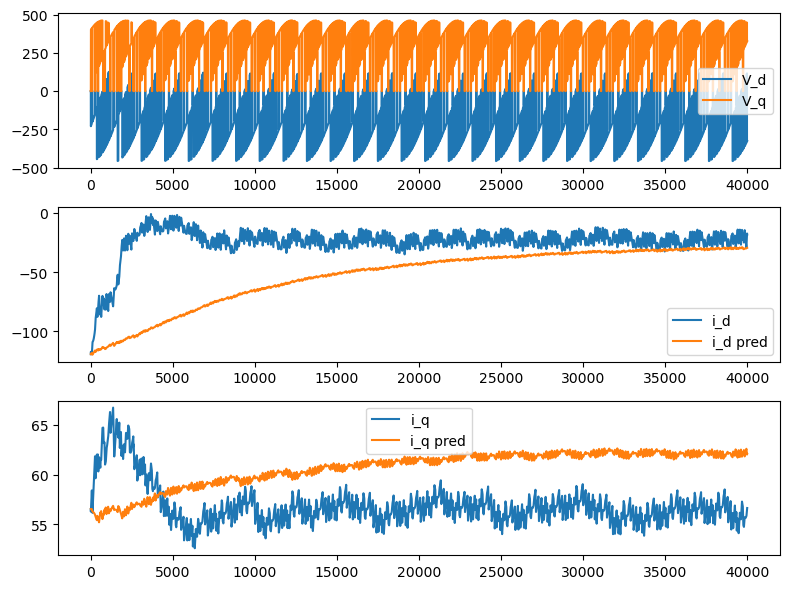

MAE : 20.677513122558594, MSE : 891.4249267578125


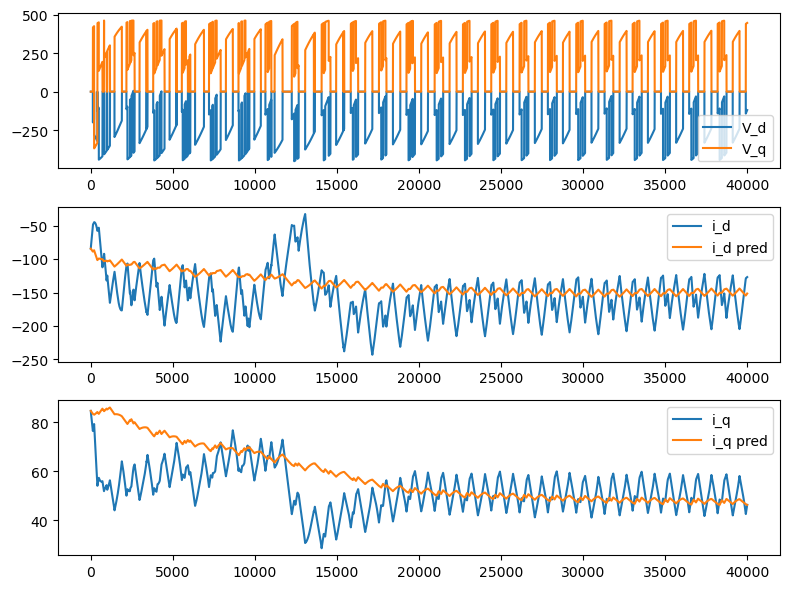

MAE : 21.345470428466797, MSE : 1369.4549560546875


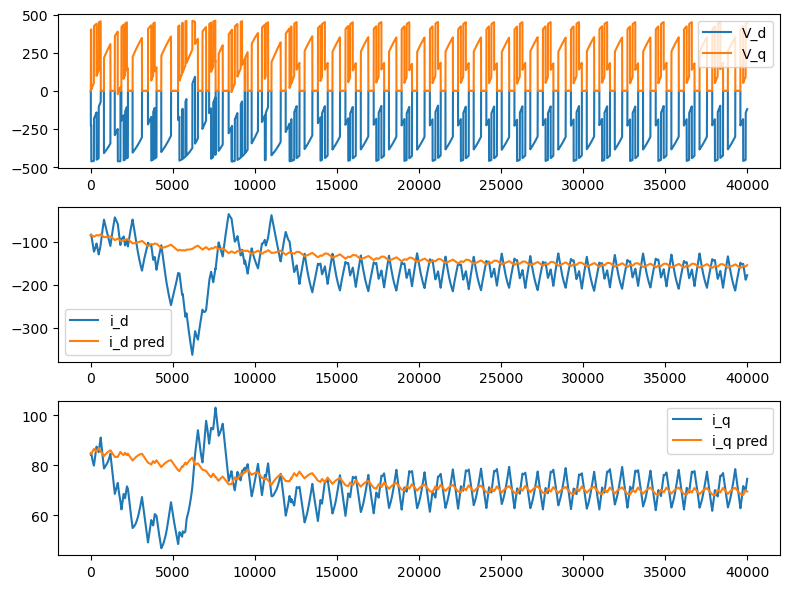

MAE : 20.46158790588379, MSE : 979.6123046875


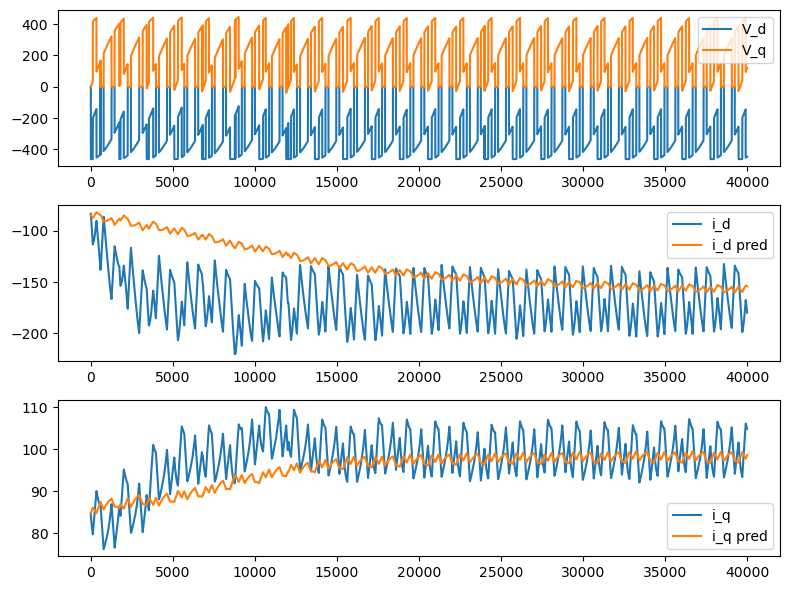

MAE : 26.921733856201172, MSE : 1578.7406005859375


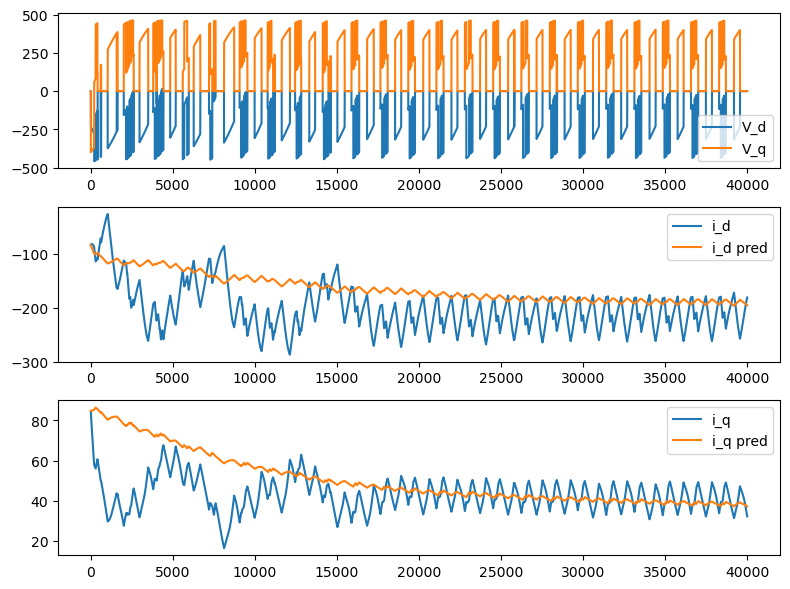

MAE : 17.575380325317383, MSE : 748.3941040039062


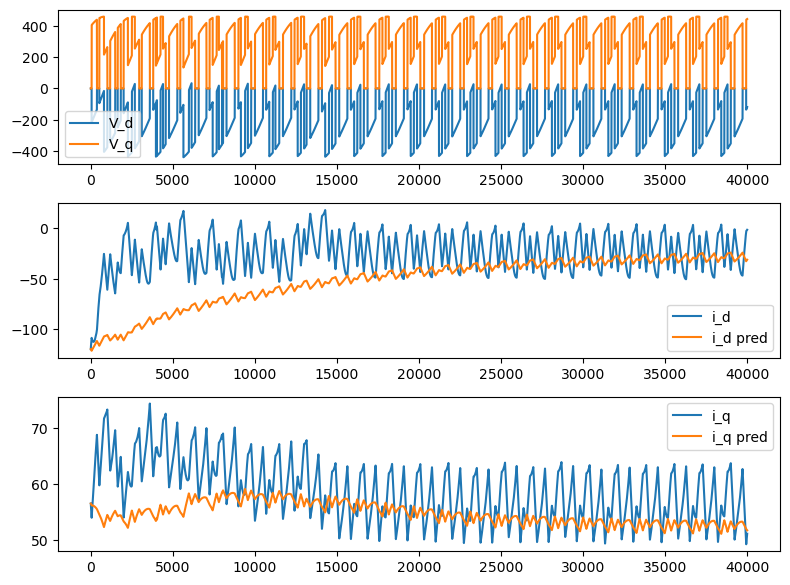

MAE : 30.763486862182617, MSE : 2268.27783203125


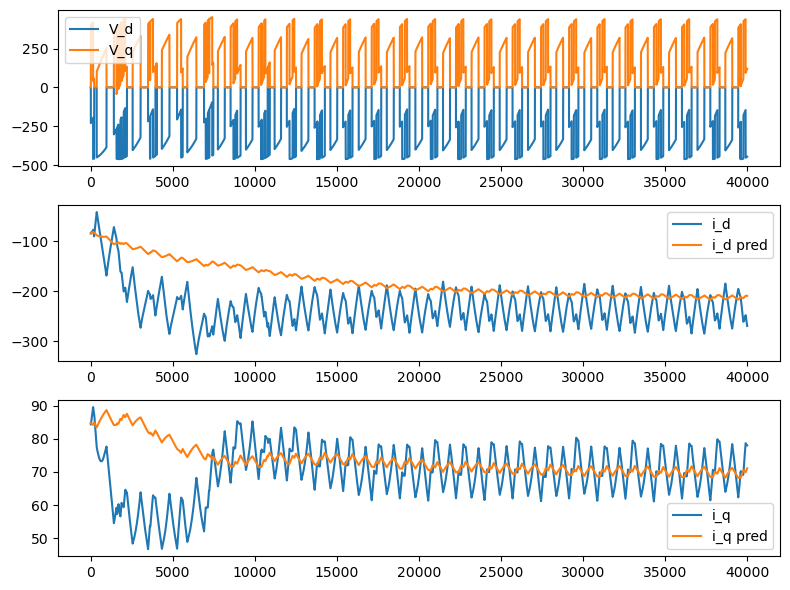

MAE : 42.163692474365234, MSE : 3931.097900390625


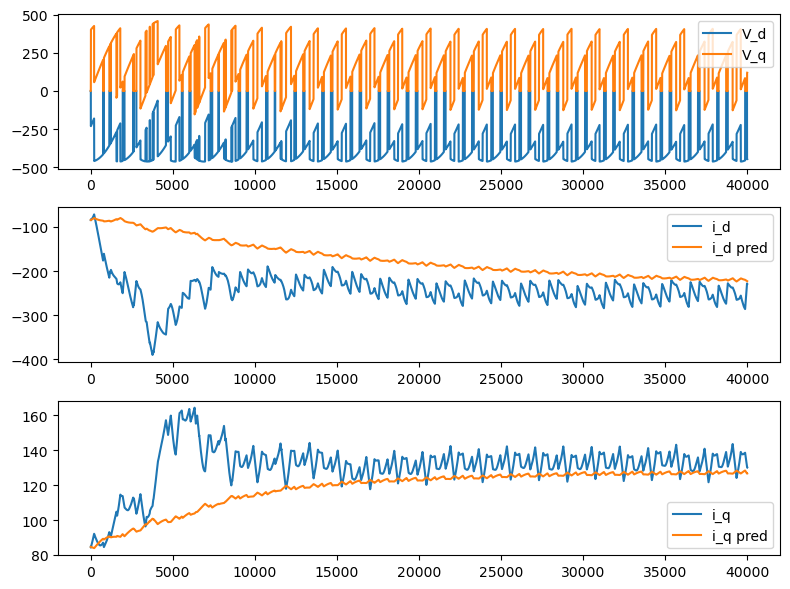

MAE : 43.788604736328125, MSE : 5397.42626953125


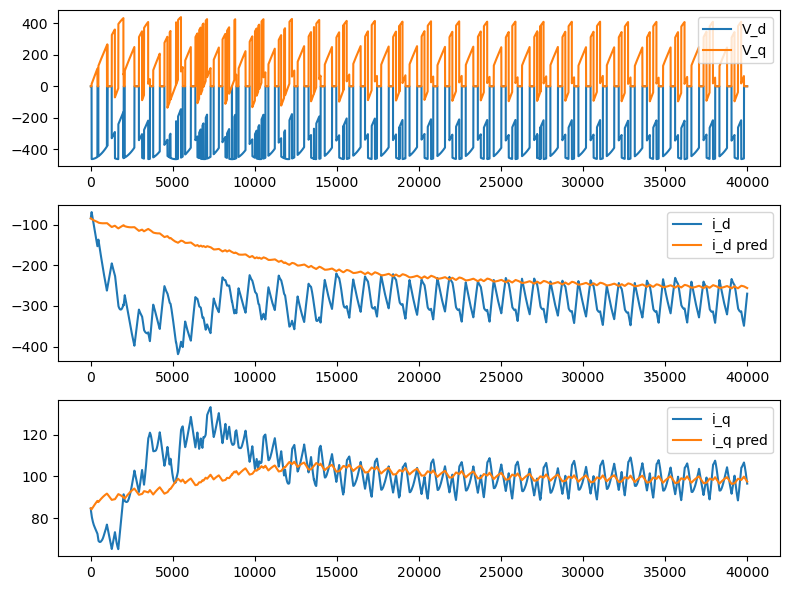

MAE : 17.019128799438477, MSE : 630.46826171875


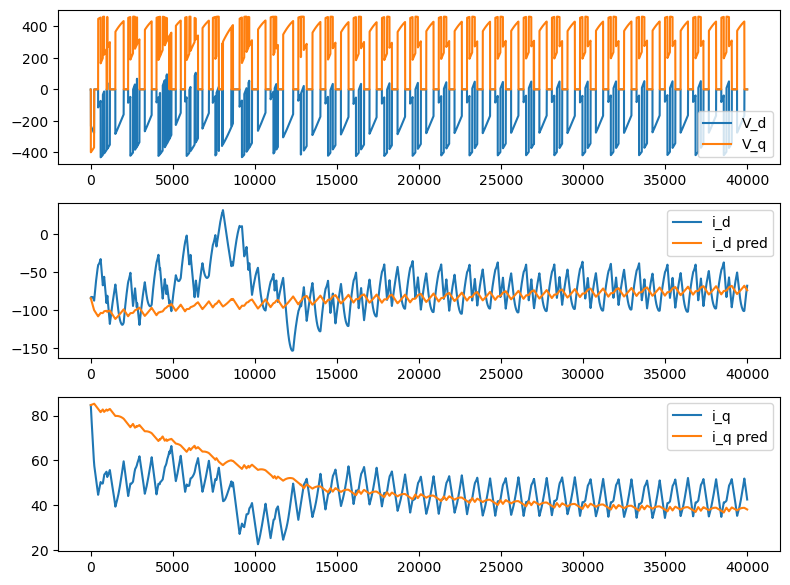

MAE : 8.5697603225708, MSE : 146.62191772460938


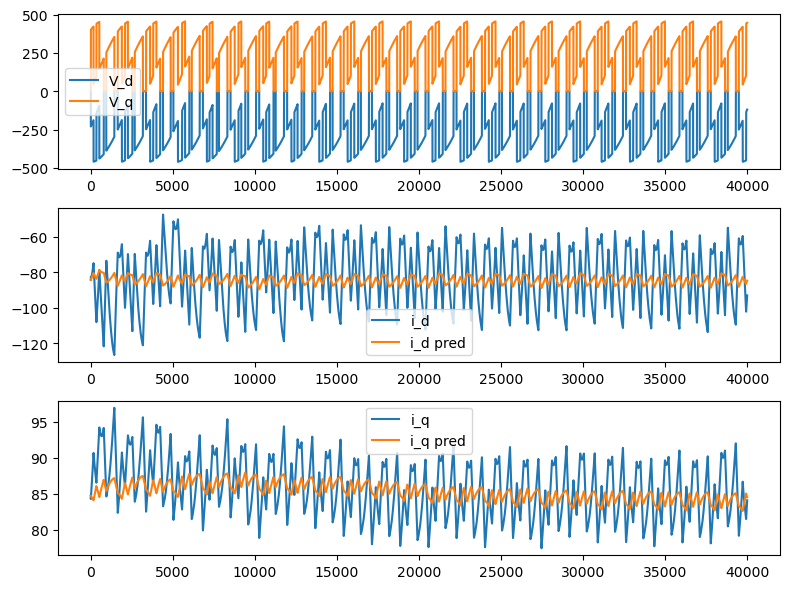

MAE : 17.618284225463867, MSE : 687.4280395507812


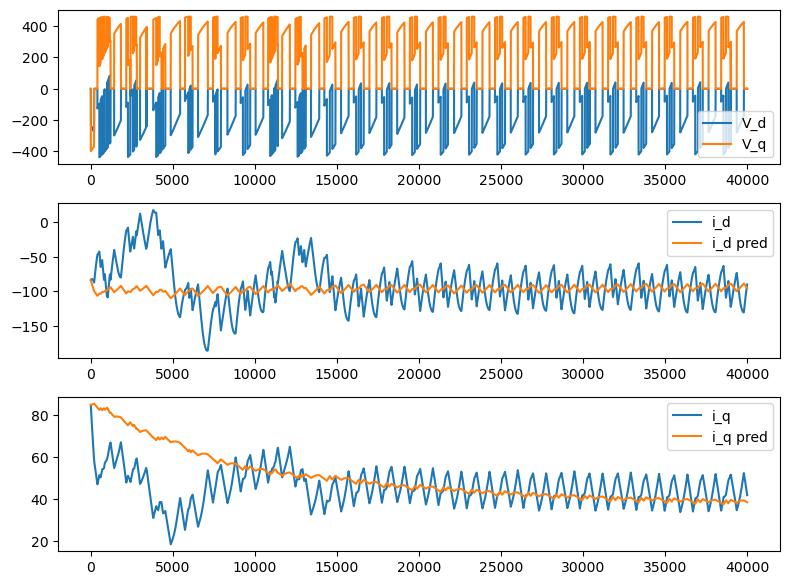

MAE : 15.656204223632812, MSE : 463.7866516113281


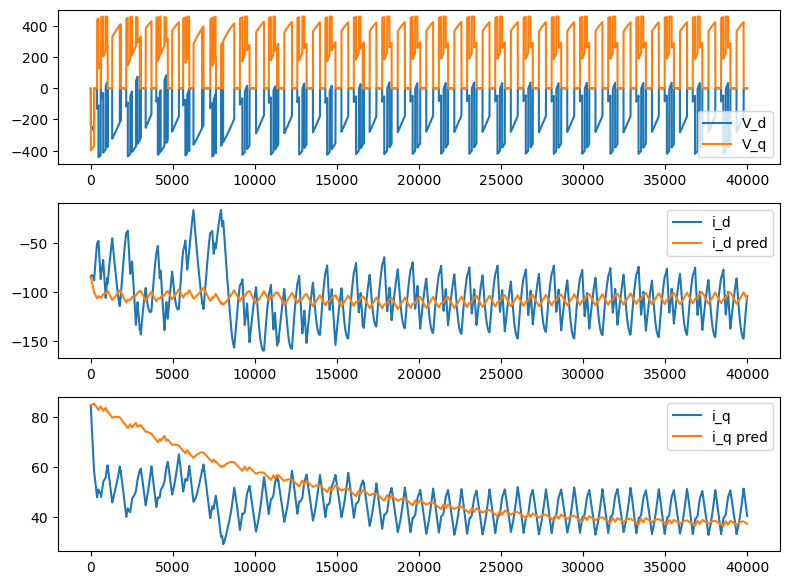

MAE : 13.457496643066406, MSE : 341.3435974121094


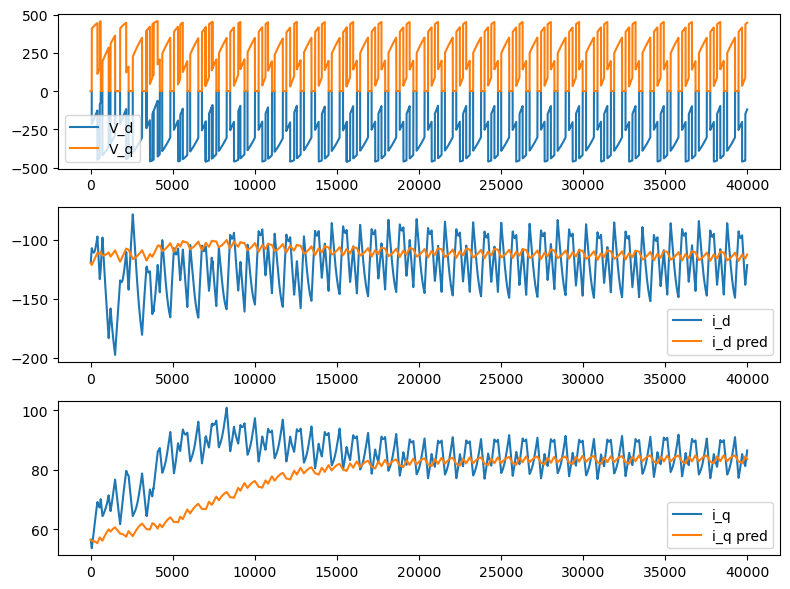

MAE : 17.99720001220703, MSE : 751.7904663085938


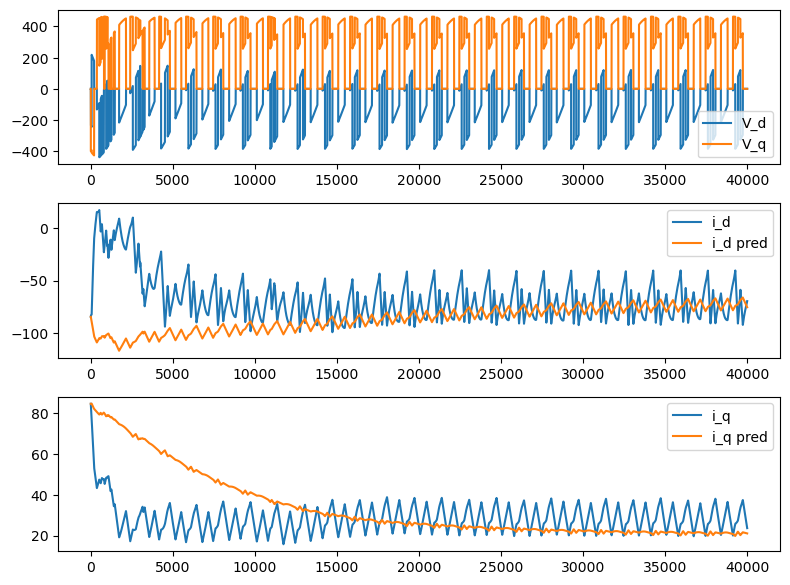

MAE : 13.594318389892578, MSE : 390.0604553222656


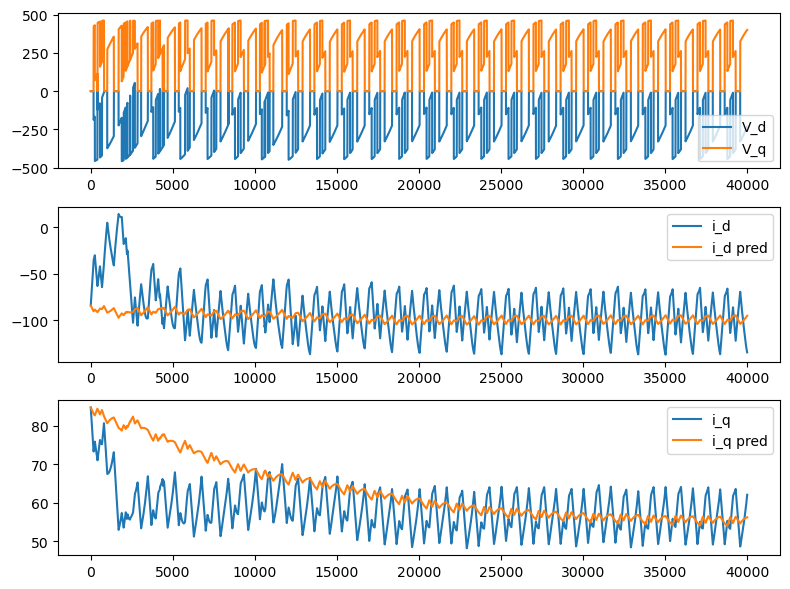

MAE : 15.704207420349121, MSE : 437.0426940917969


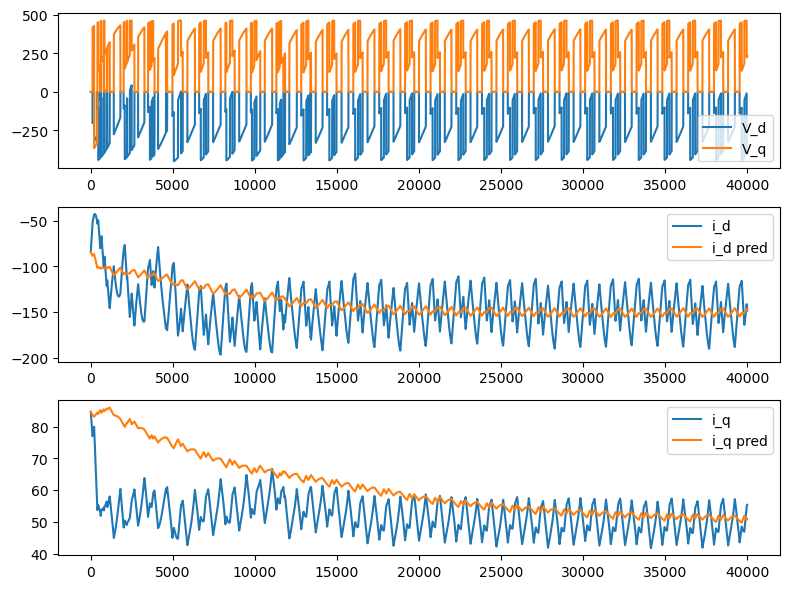

MAE : 22.985061645507812, MSE : 1088.467041015625


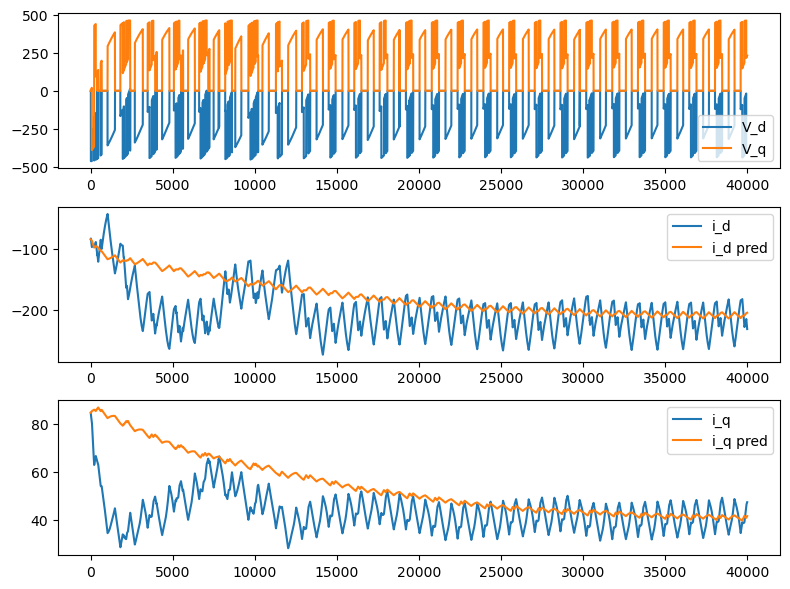

MAE : 35.64356994628906, MSE : 3603.297607421875


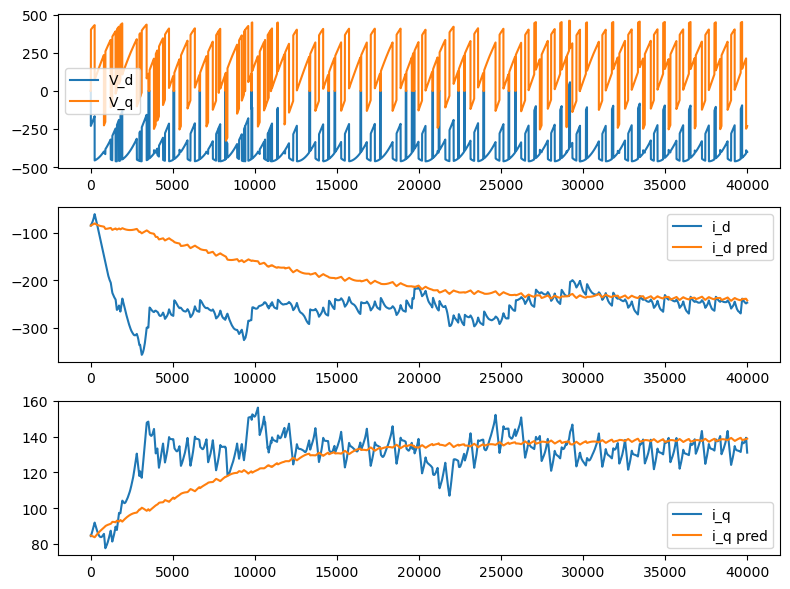

MAE : 38.985267639160156, MSE : 4417.68310546875


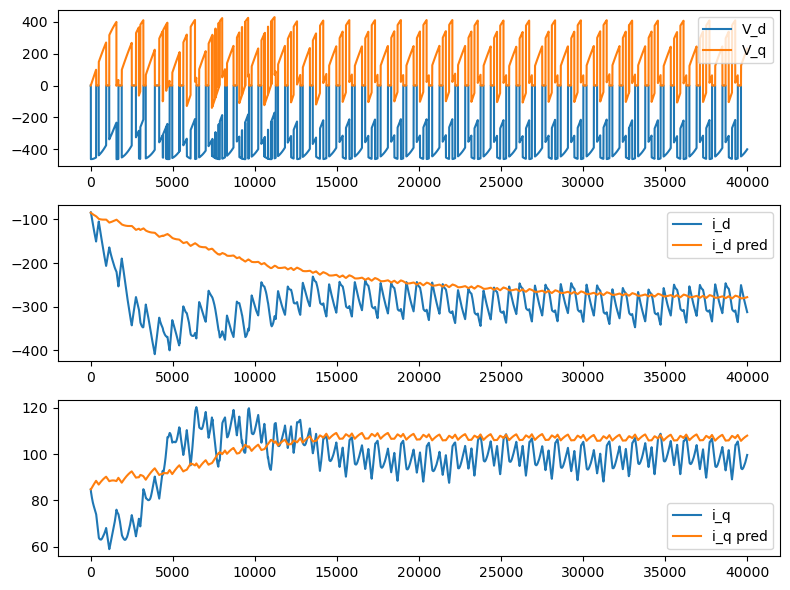

MAE : 13.579833984375, MSE : 344.53369140625


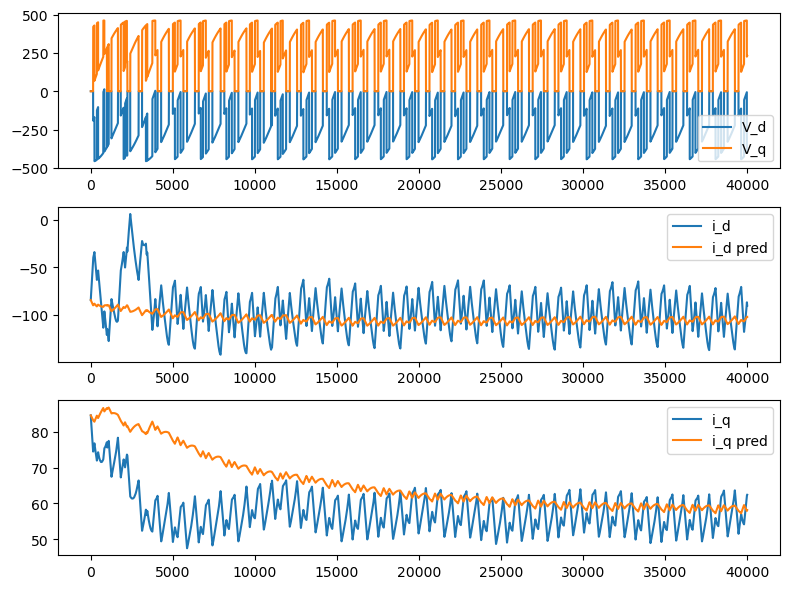

MAE : 11.85654354095459, MSE : 341.8428039550781


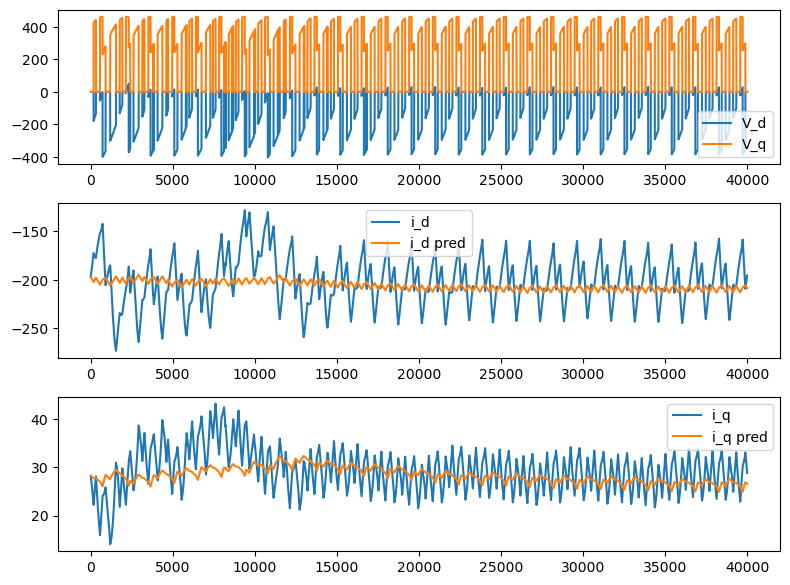

MAE : 18.246437072753906, MSE : 739.5847778320312


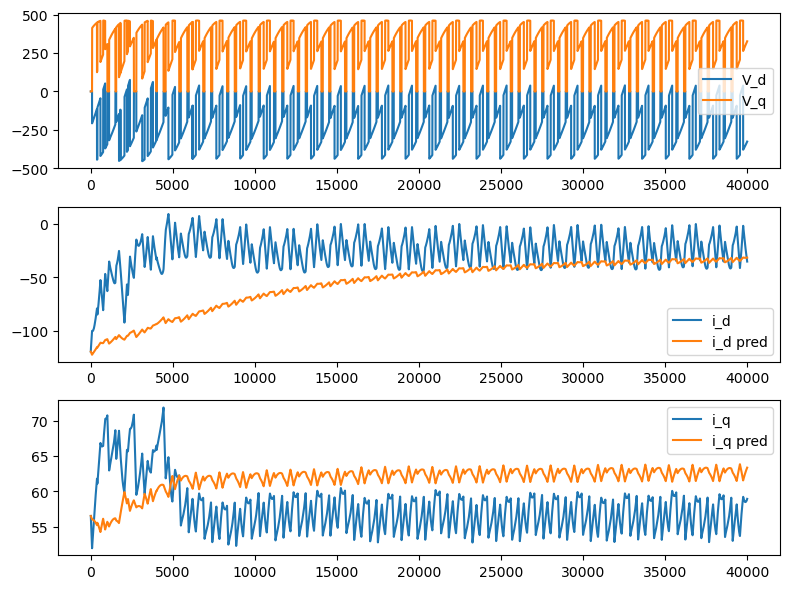

MAE : 32.03206253051758, MSE : 2450.043701171875


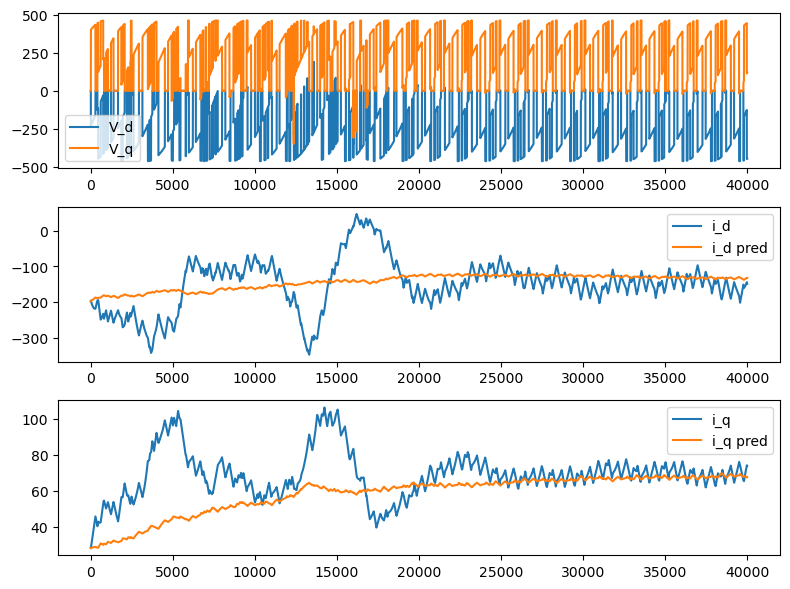

MAE : 32.35080337524414, MSE : 2356.8603515625


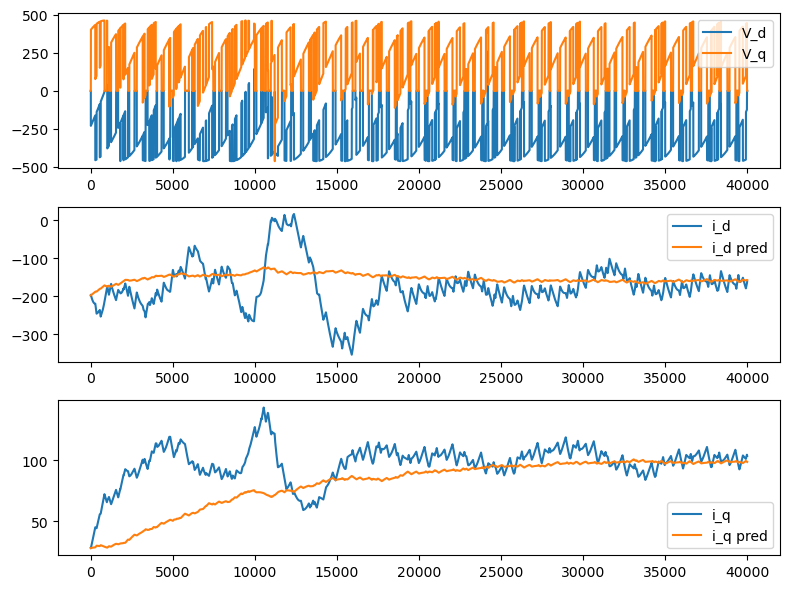

MAE : 17.9182186126709, MSE : 676.4104614257812


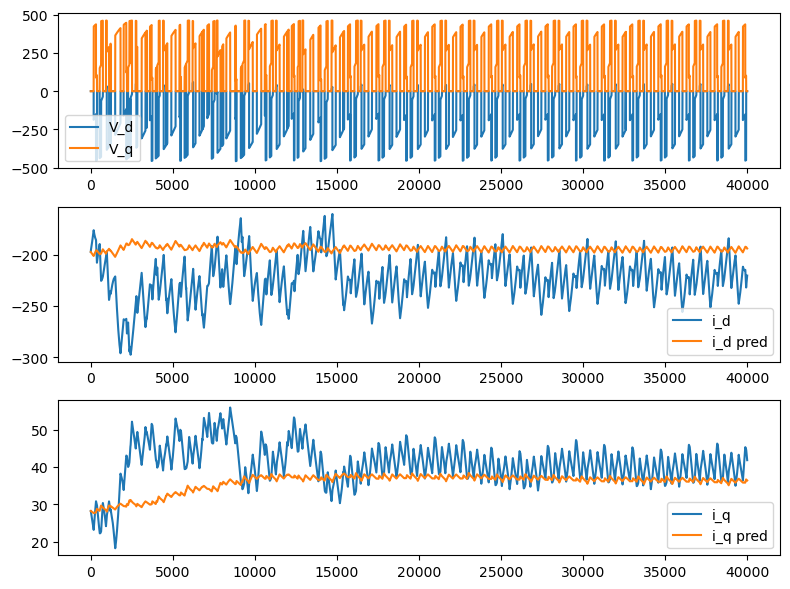

MAE : 16.61308479309082, MSE : 711.3770751953125


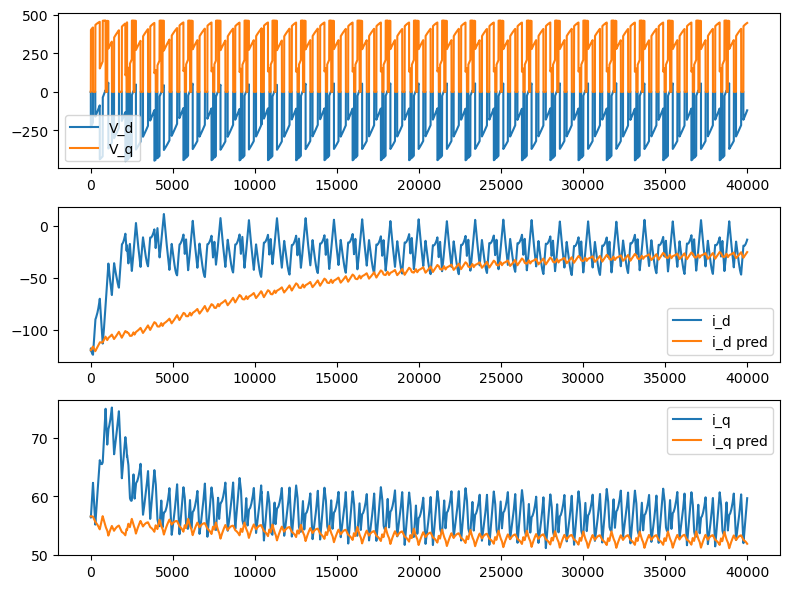

MAE : 25.127696990966797, MSE : 1383.8934326171875


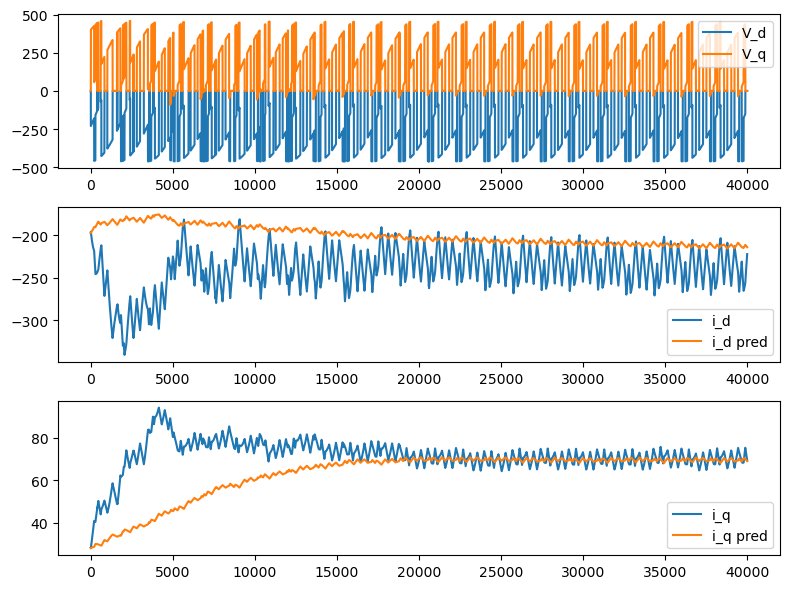

MAE : 34.772239685058594, MSE : 2254.53076171875


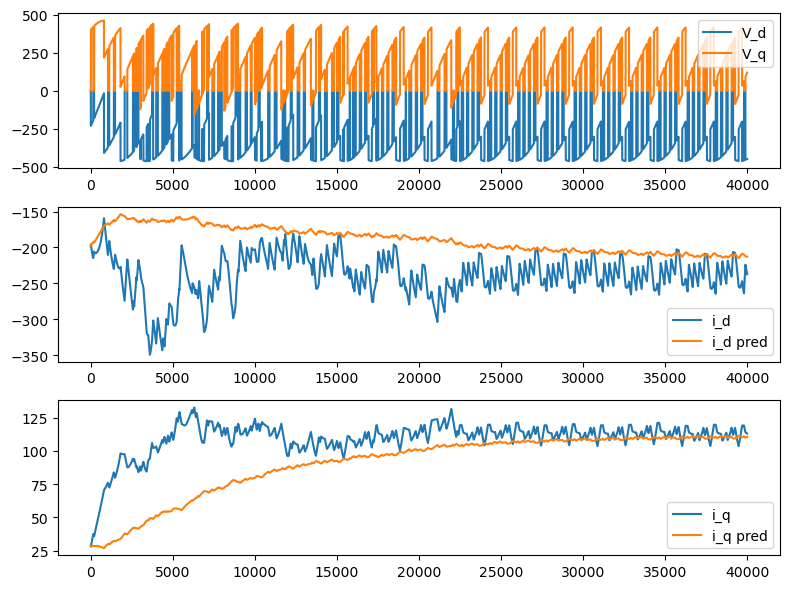

MAE : 42.63036346435547, MSE : 2829.995849609375


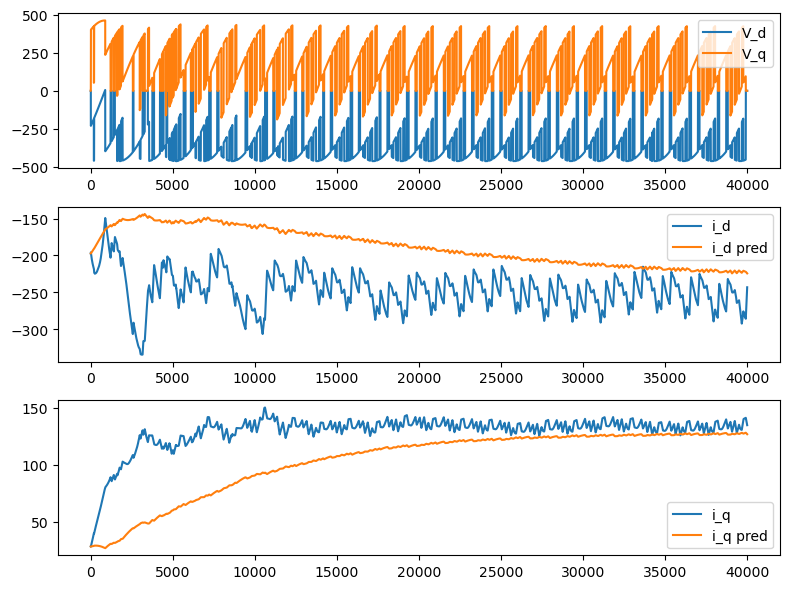

MAE : 31.528900146484375, MSE : 2343.397705078125


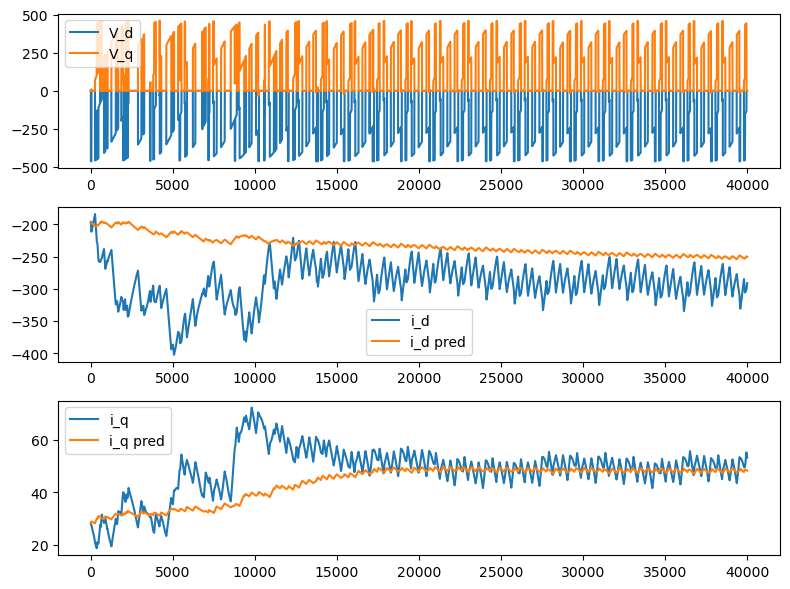

MAE : 45.57809066772461, MSE : 4768.19384765625


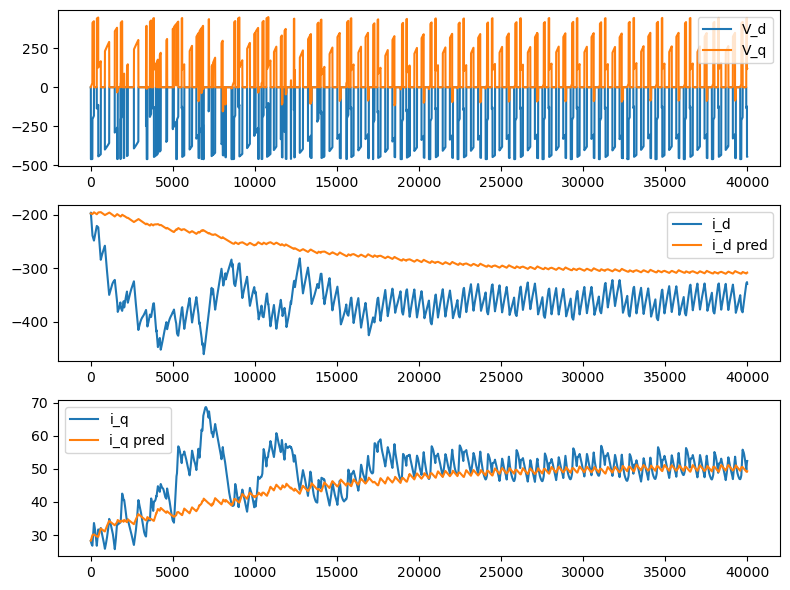

MAE : 20.945663452148438, MSE : 926.660400390625


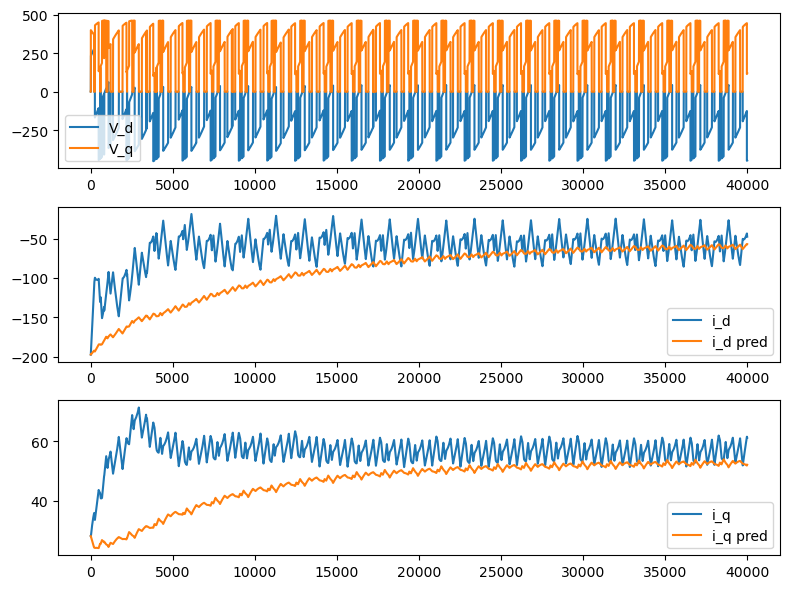

MAE : 8.147491455078125, MSE : 158.55264282226562


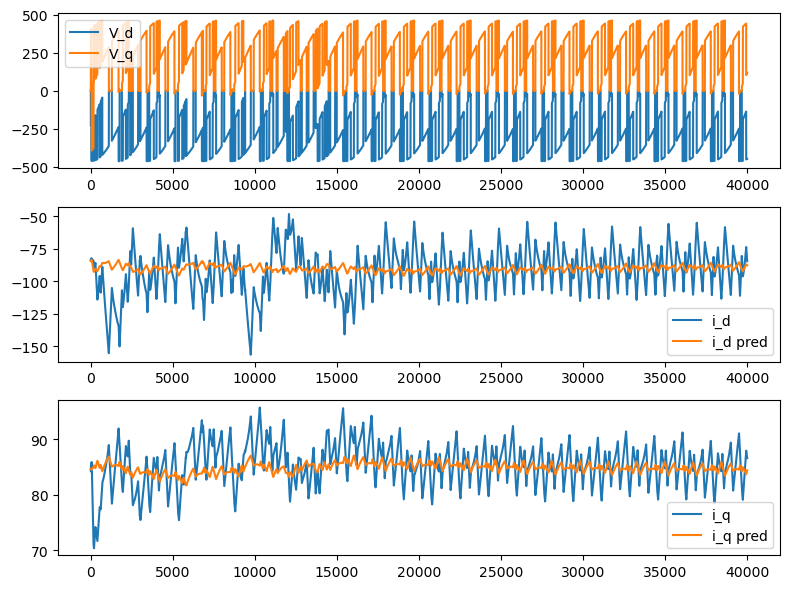

MAE : 15.588570594787598, MSE : 515.6956787109375


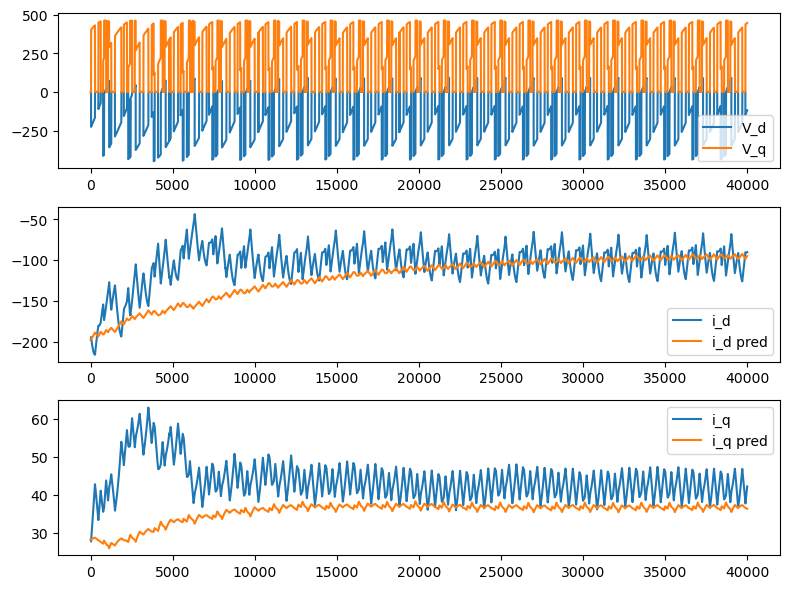

MAE : 13.474151611328125, MSE : 499.2119445800781


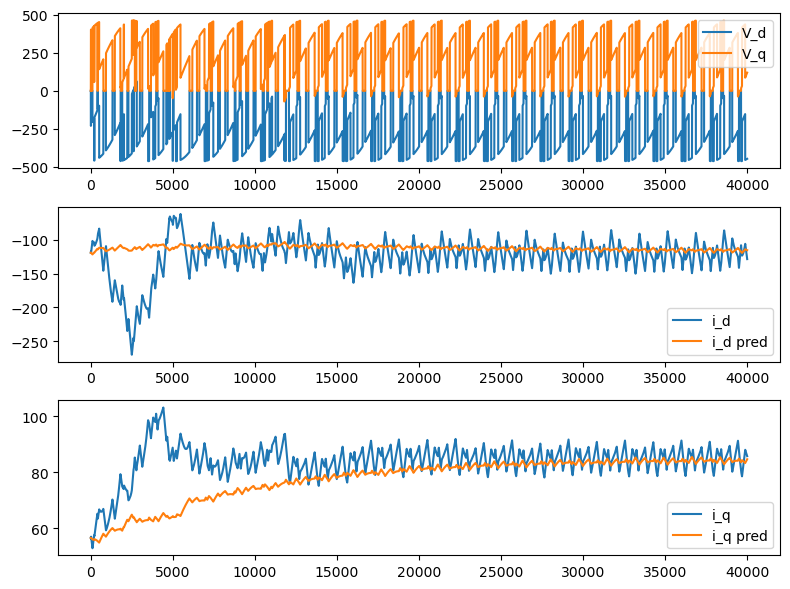

MAE : 21.604135513305664, MSE : 901.6439208984375


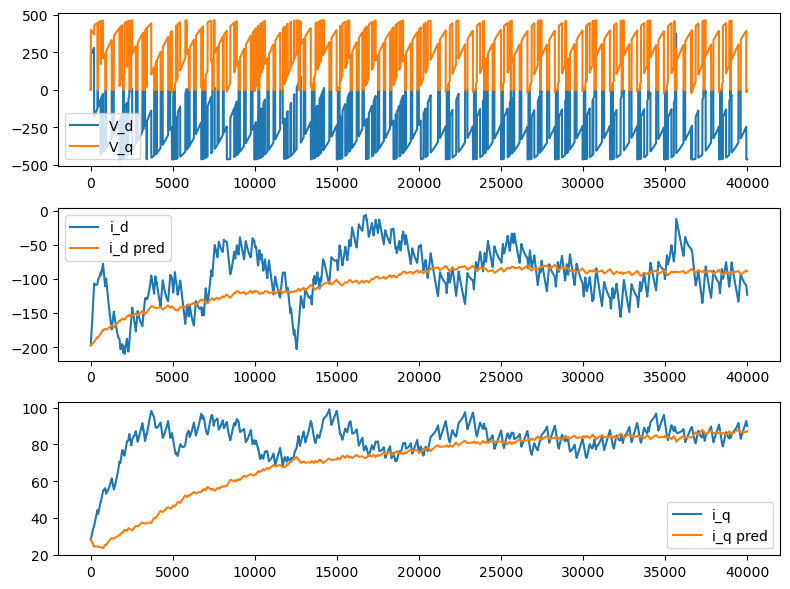

MAE : 14.001688957214355, MSE : 499.7871398925781


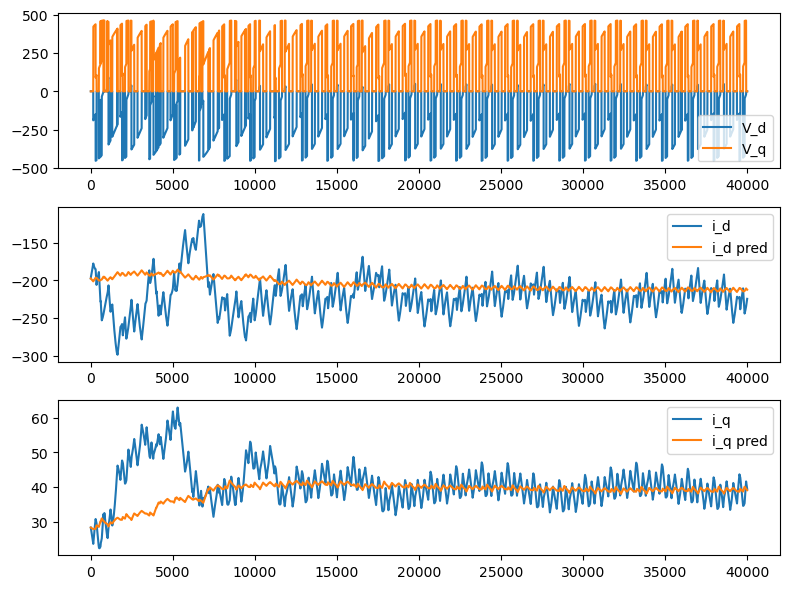

MAE : 20.833162307739258, MSE : 1143.1729736328125


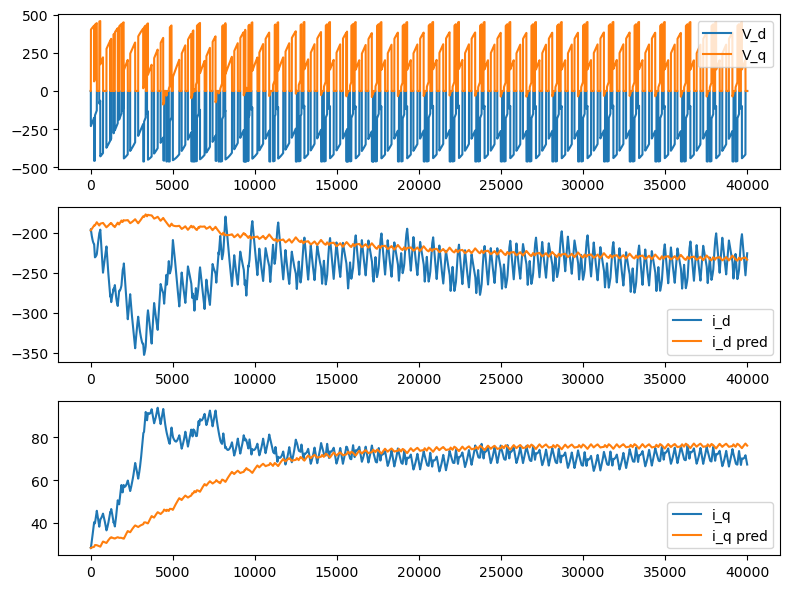

MAE : 28.25499153137207, MSE : 1916.8157958984375


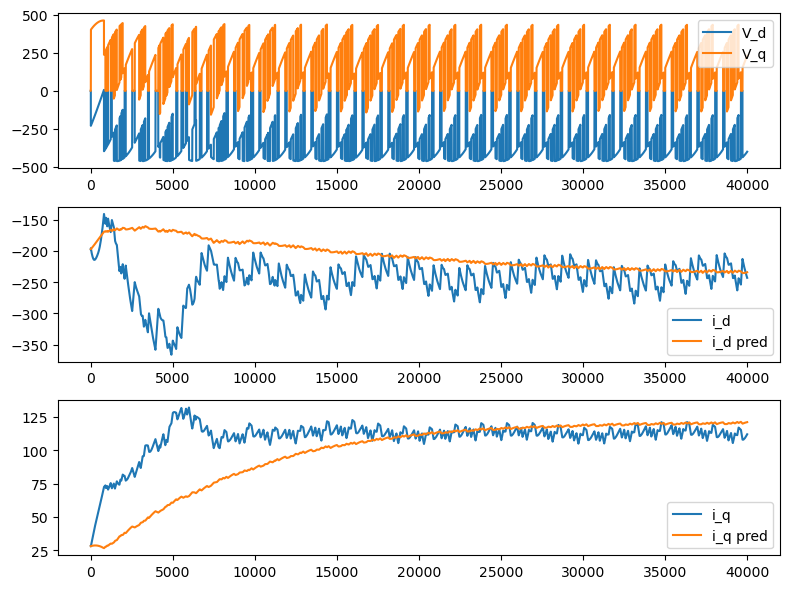

MAE : 33.875003814697266, MSE : 2421.74365234375


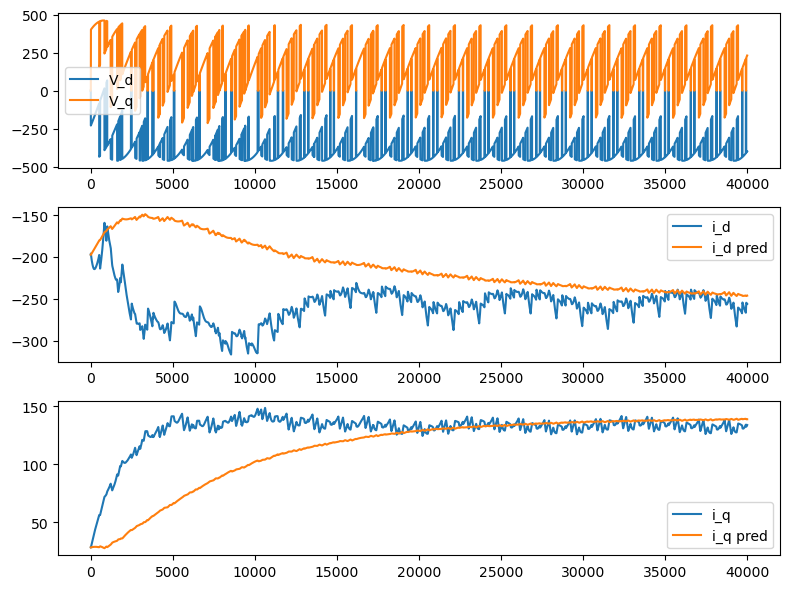

MAE : 25.719331741333008, MSE : 1800.2242431640625


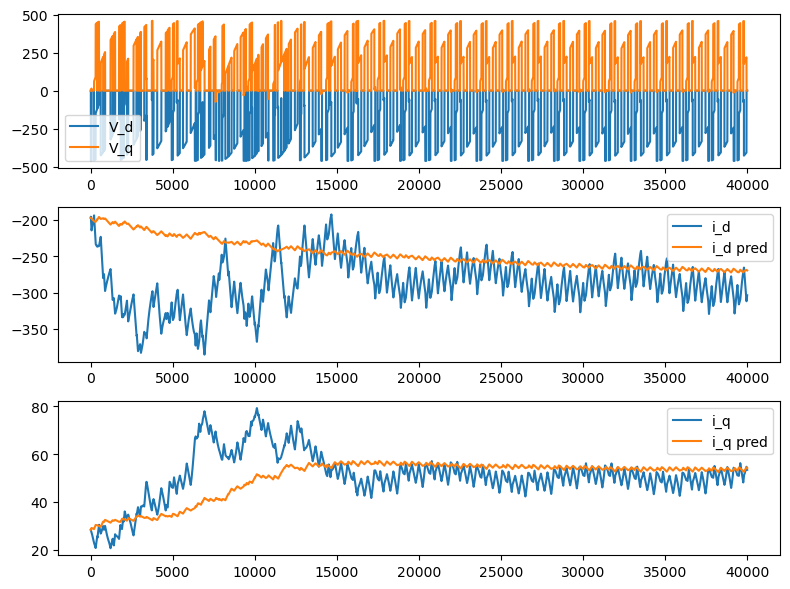

MAE : 22.88465690612793, MSE : 864.7252197265625


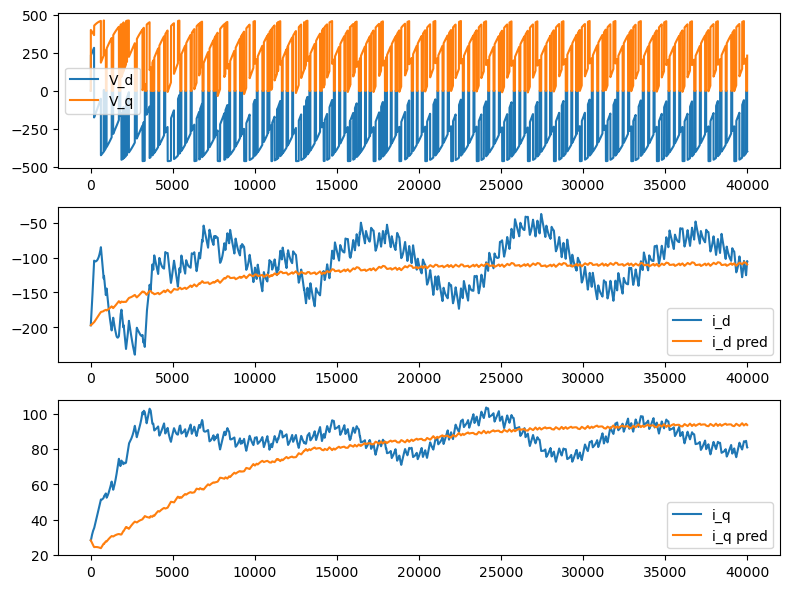

MAE : 8.227560043334961, MSE : 138.590576171875


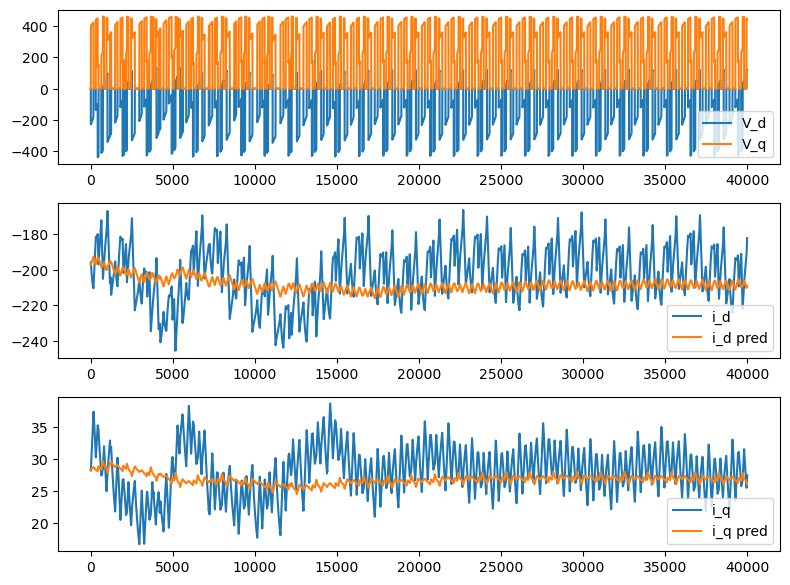

MAE : 7.7545166015625, MSE : 122.27727508544922


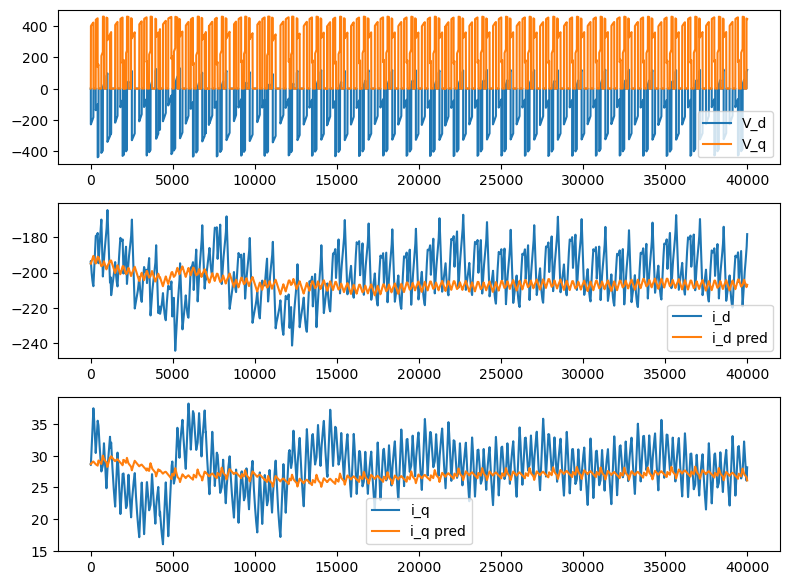

MAE : 17.589372634887695, MSE : 691.83154296875


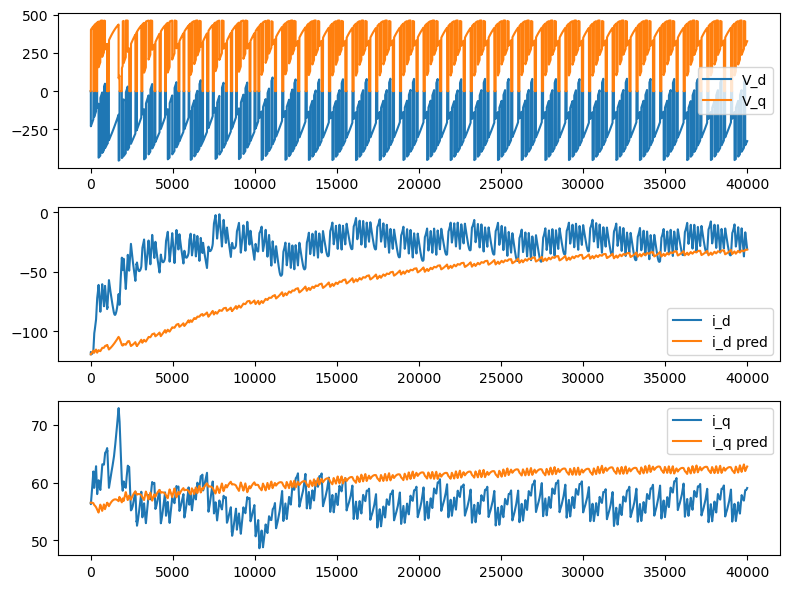

MAE : 13.619047164916992, MSE : 361.5272216796875


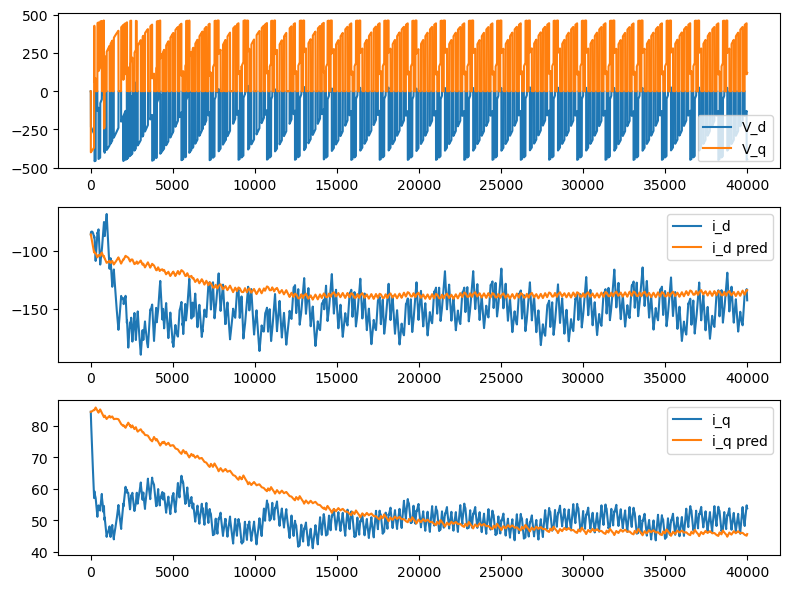

MAE : 16.381980895996094, MSE : 638.9188232421875


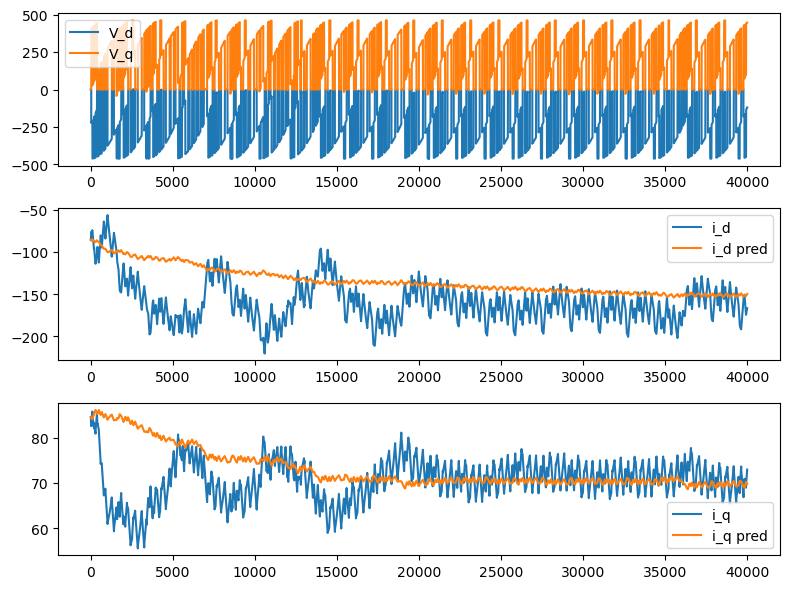

MAE : 15.955723762512207, MSE : 668.3770141601562


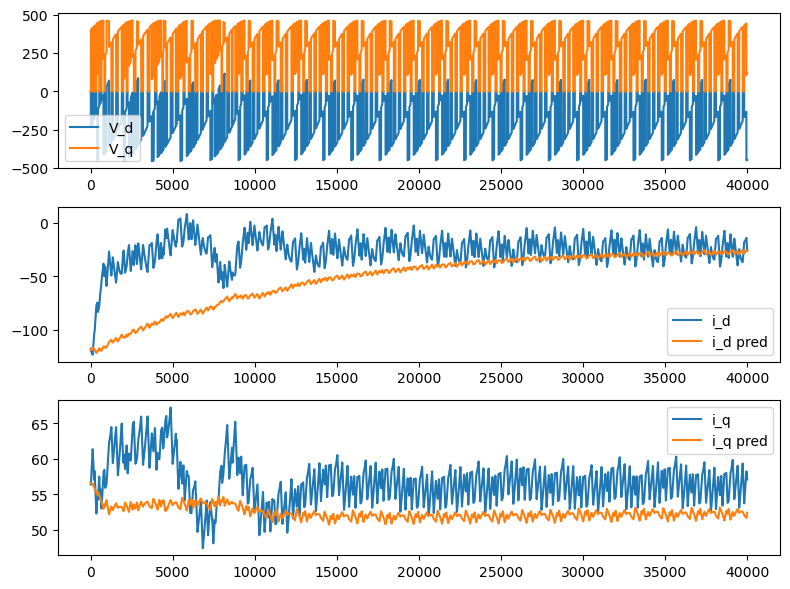

MAE : 43.88335418701172, MSE : 4262.47900390625


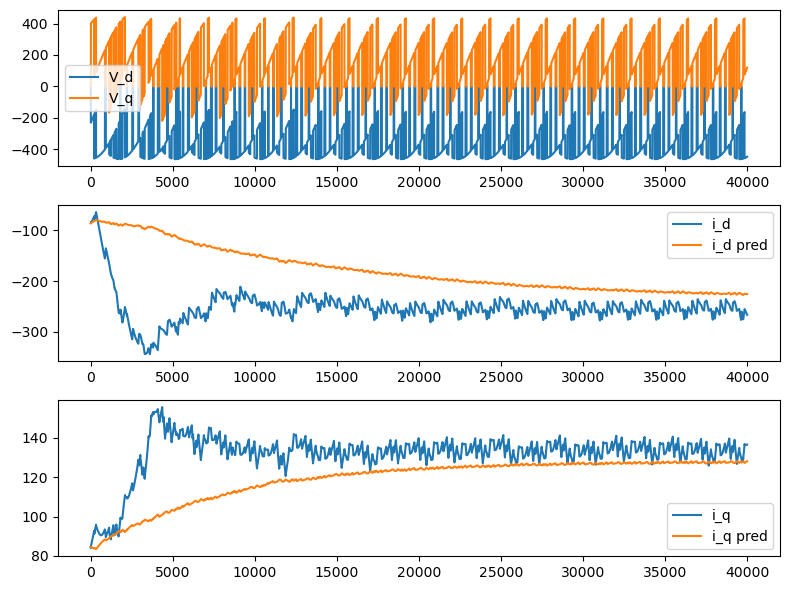

MAE : 45.05823516845703, MSE : 5163.60302734375


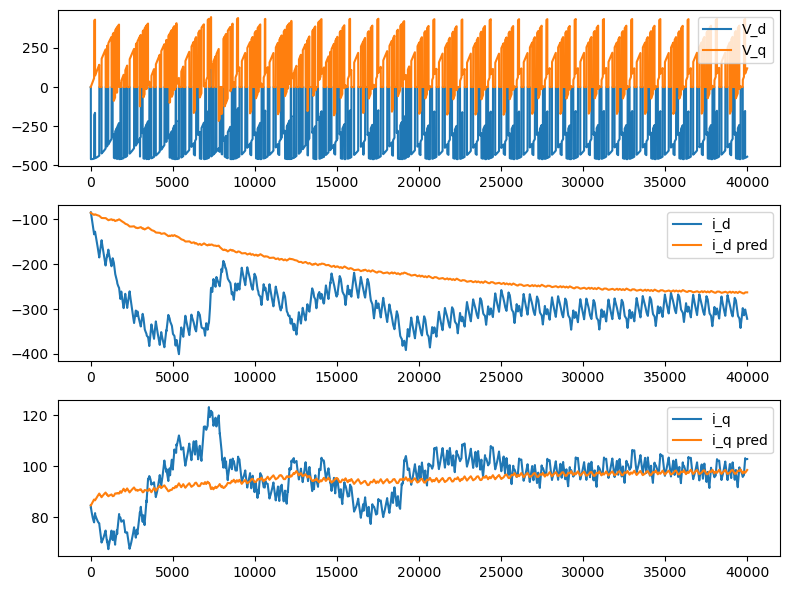

MAE : 5.543773174285889, MSE : 49.975914001464844


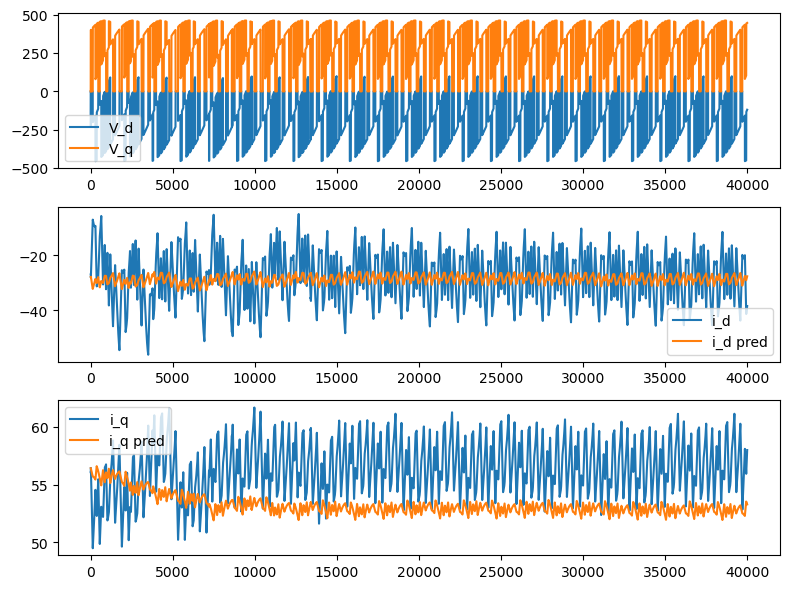

MAE : 13.253005981445312, MSE : 371.4920349121094


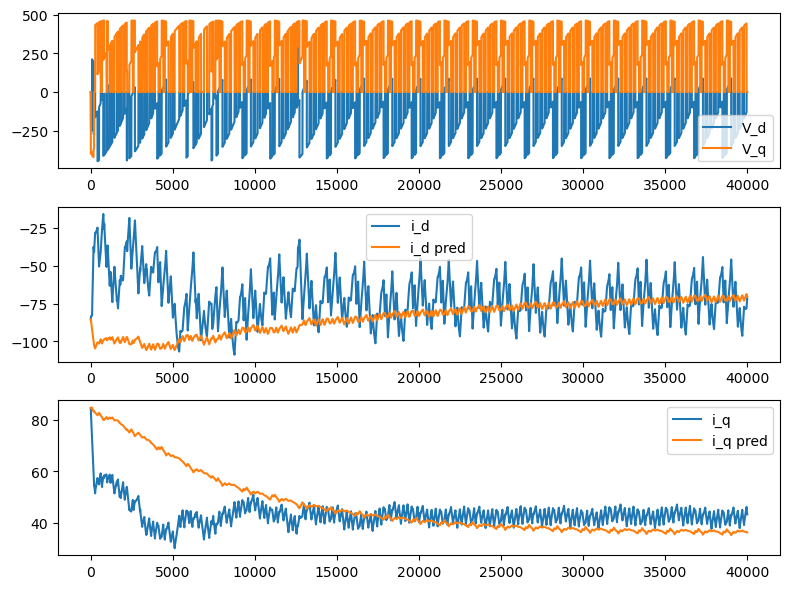

MAE : 5.577054977416992, MSE : 71.29241180419922


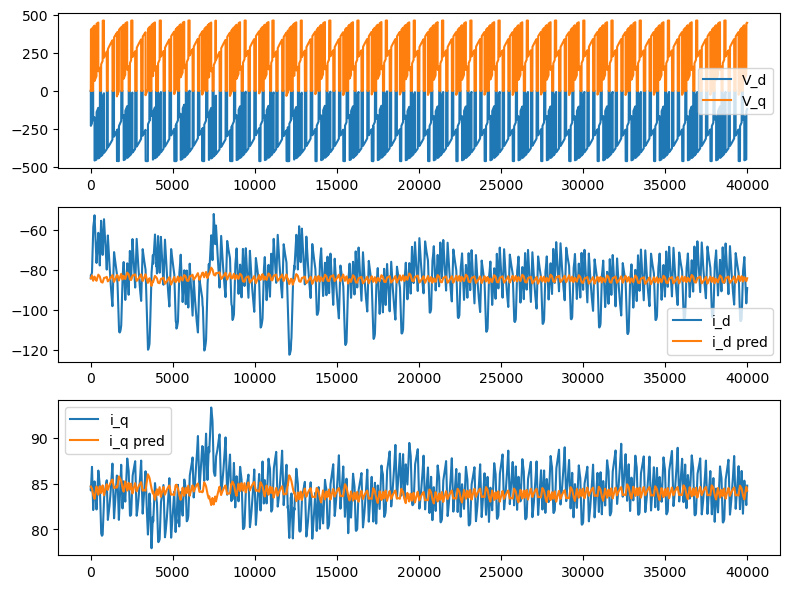

MAE : 11.664329528808594, MSE : 262.8882751464844


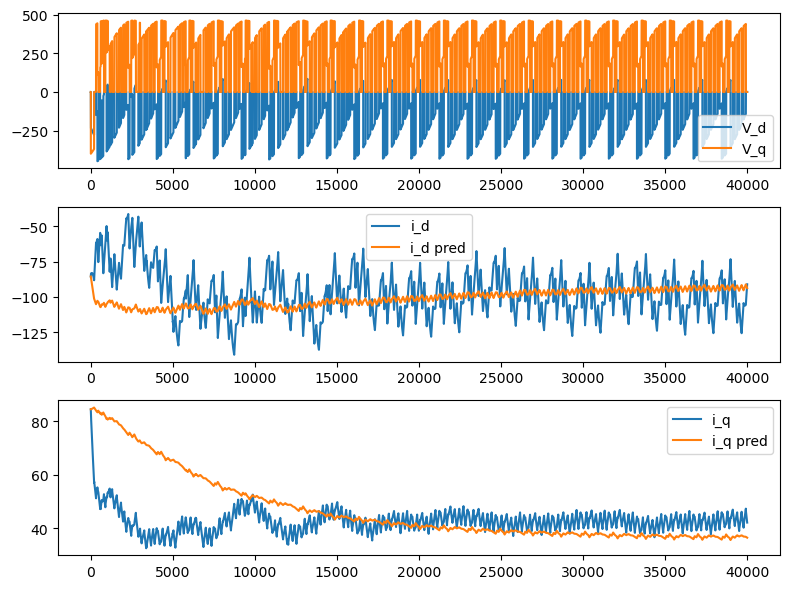

MAE : 11.24903678894043, MSE : 298.9956359863281


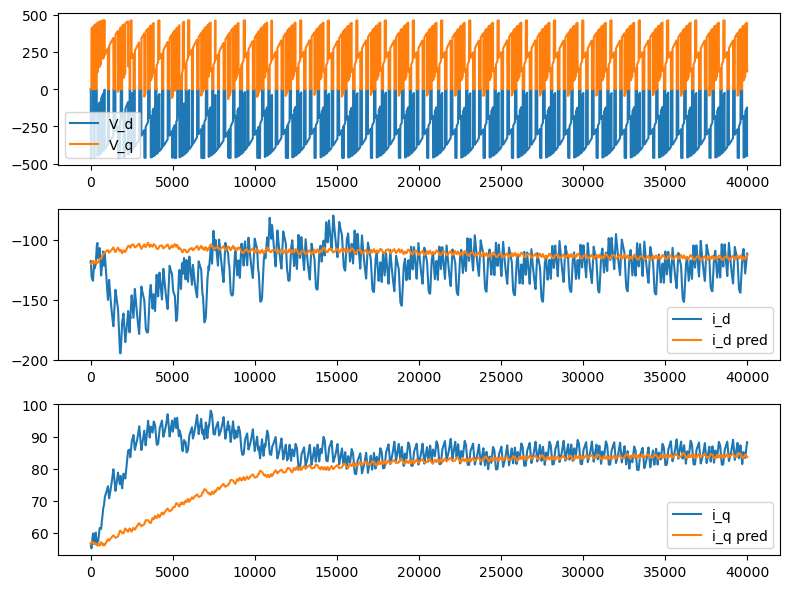

MAE : 7.154611110687256, MSE : 123.51139068603516


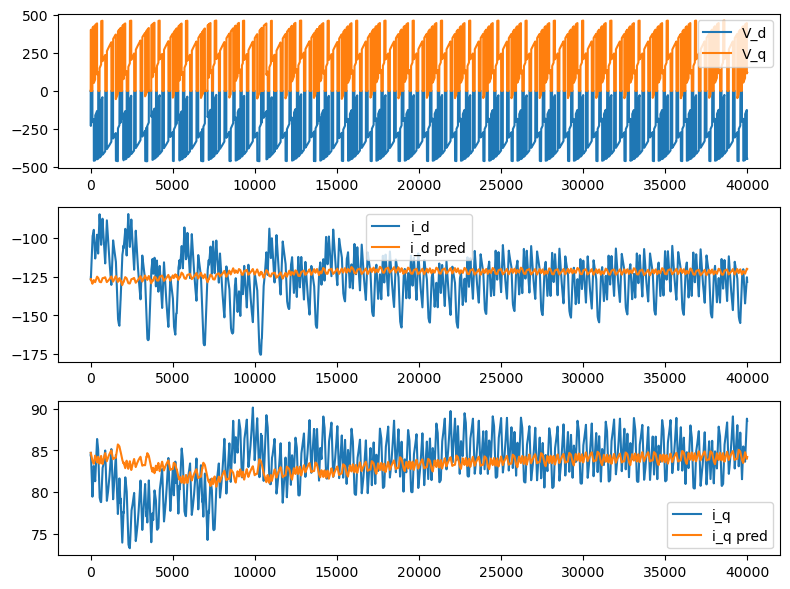

MAE : 6.4659881591796875, MSE : 102.91981506347656


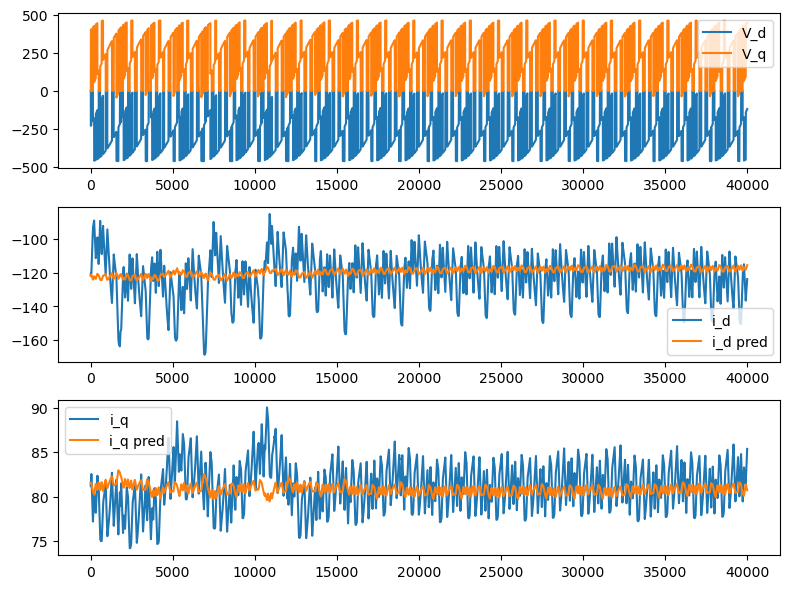

MAE : 7.4147467613220215, MSE : 118.08902740478516


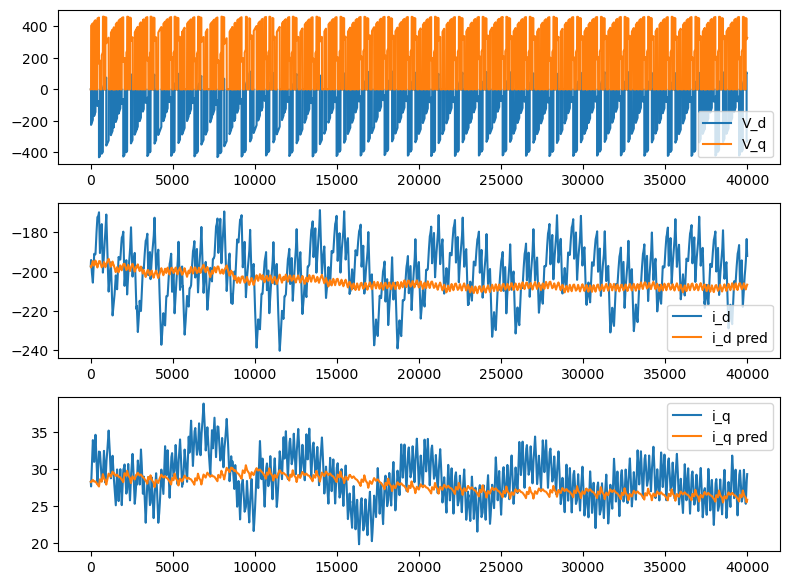

MAE : 17.135400772094727, MSE : 749.3292236328125


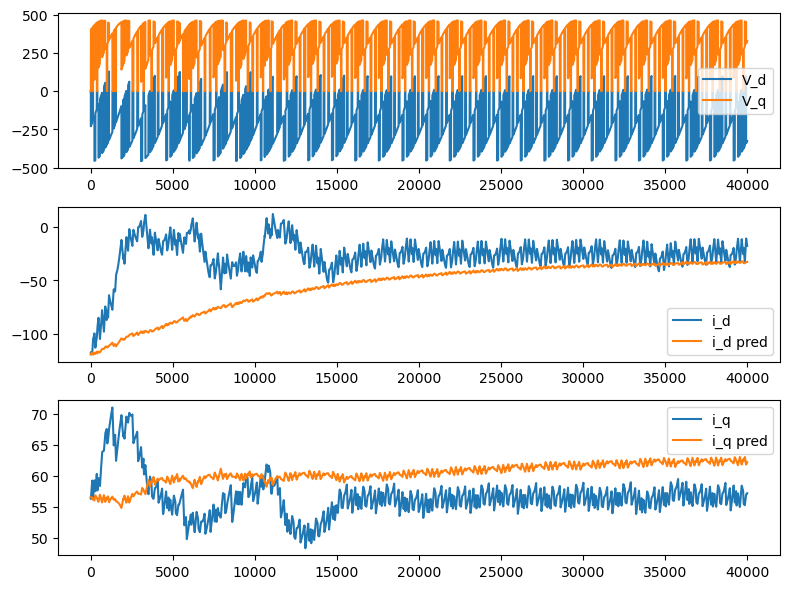

MAE : 18.757266998291016, MSE : 788.9984741210938


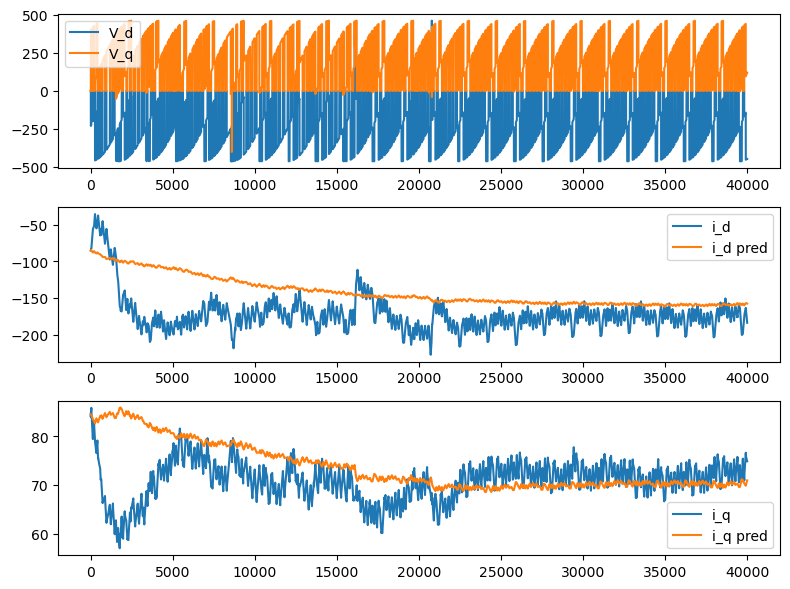

MAE : 27.31980323791504, MSE : 1561.8616943359375


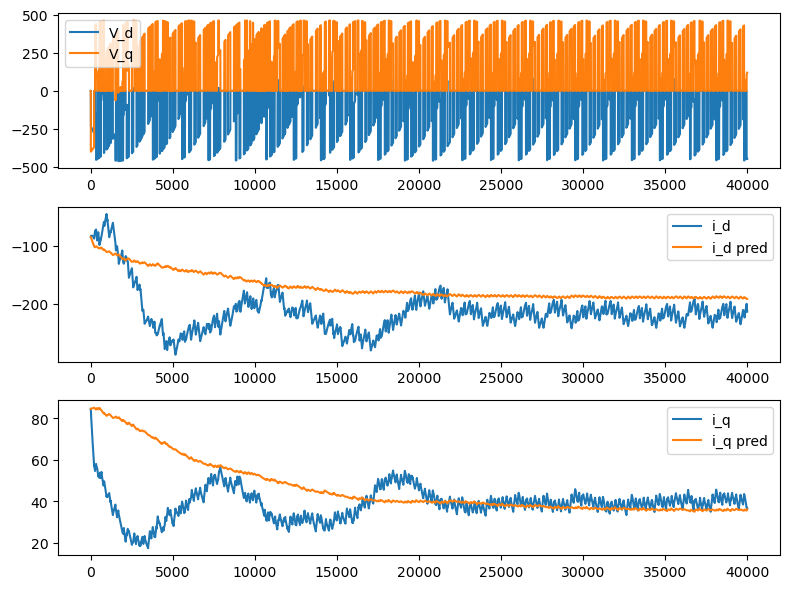

MAE : 15.325278282165527, MSE : 621.4769287109375


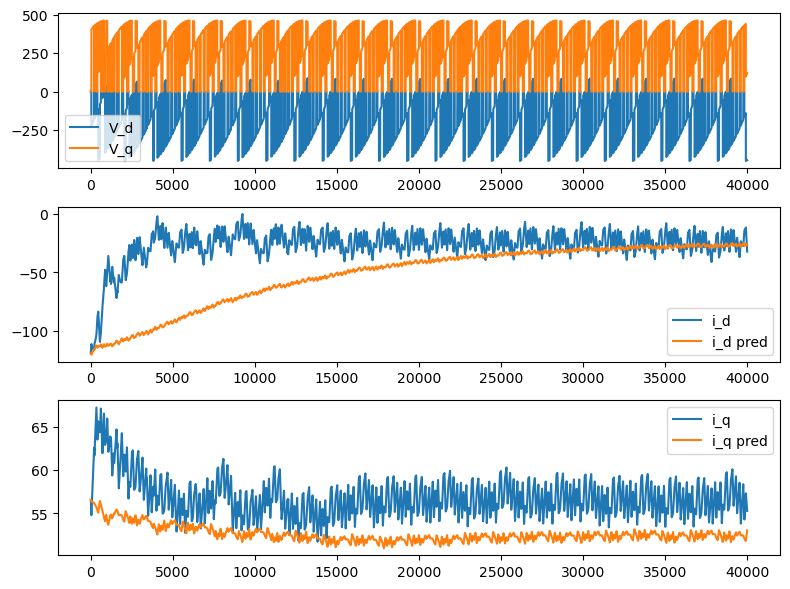

MAE : 29.418659210205078, MSE : 2038.6572265625


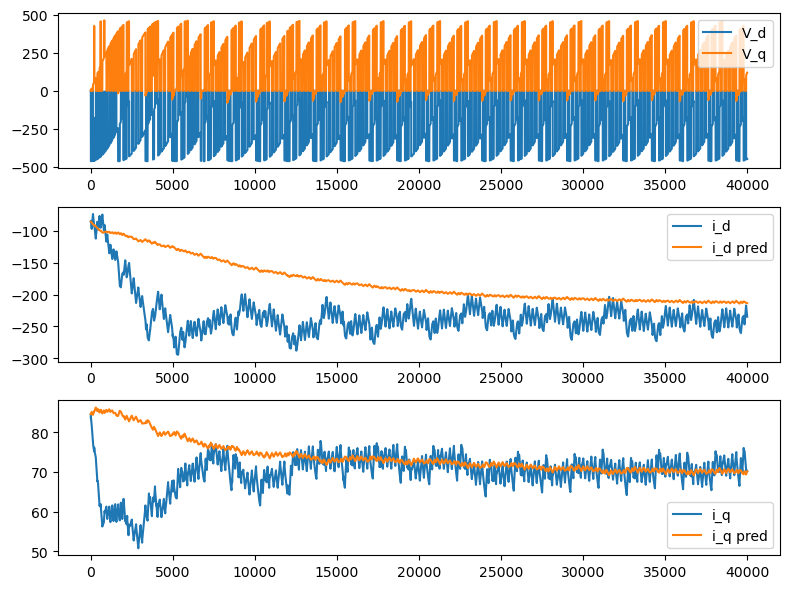

MAE : 35.3806266784668, MSE : 3032.514892578125


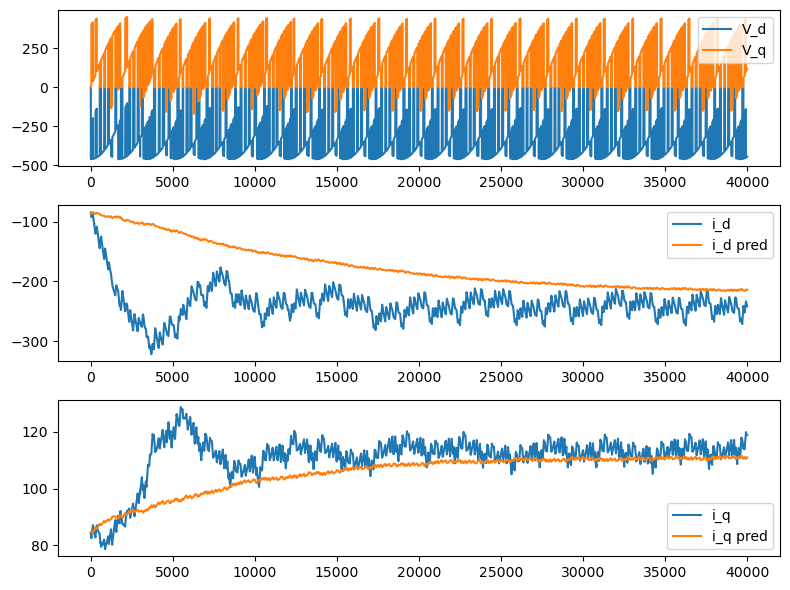

MAE : 43.972869873046875, MSE : 4434.224609375


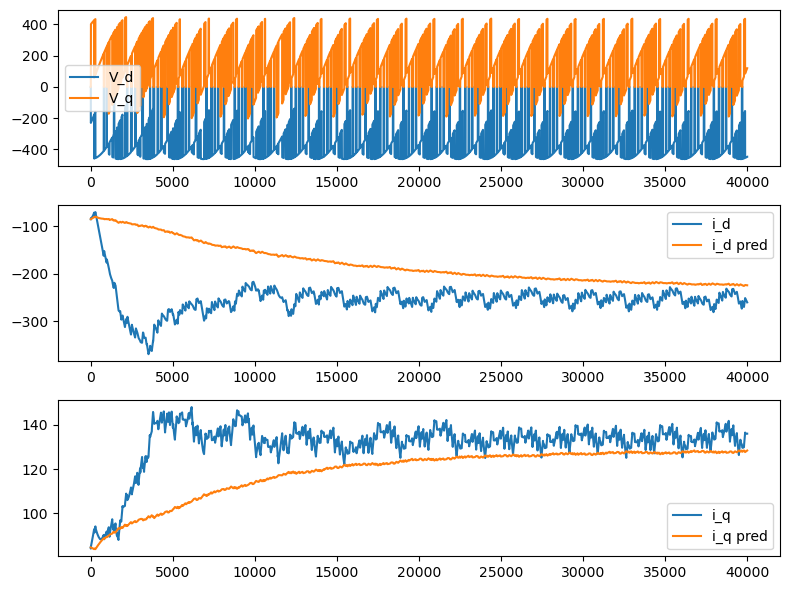

MAE : 41.04729461669922, MSE : 3549.985107421875


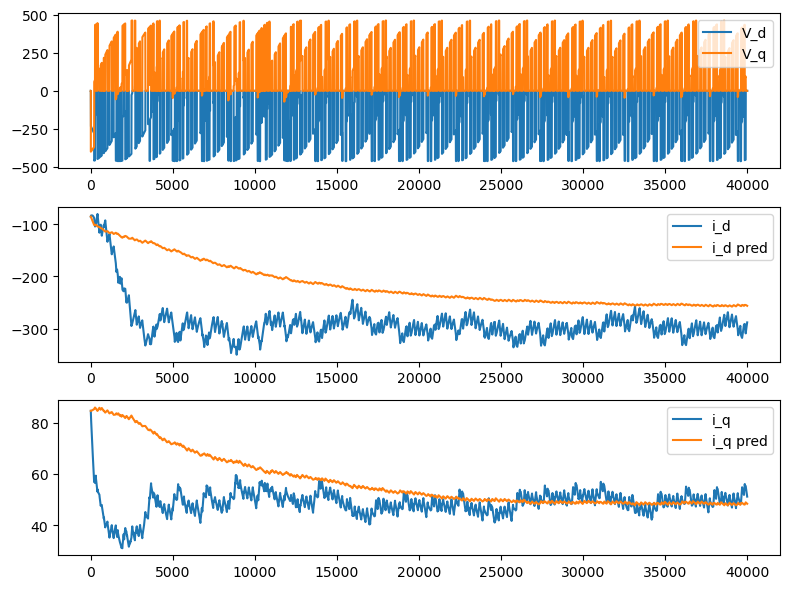

MAE : 11.965941429138184, MSE : 345.4081115722656


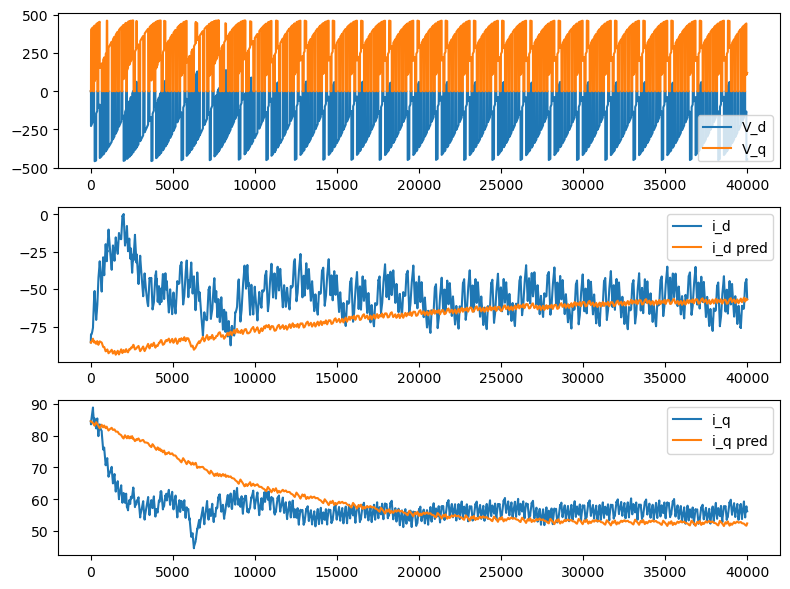

MAE : 5.179593563079834, MSE : 64.34428405761719


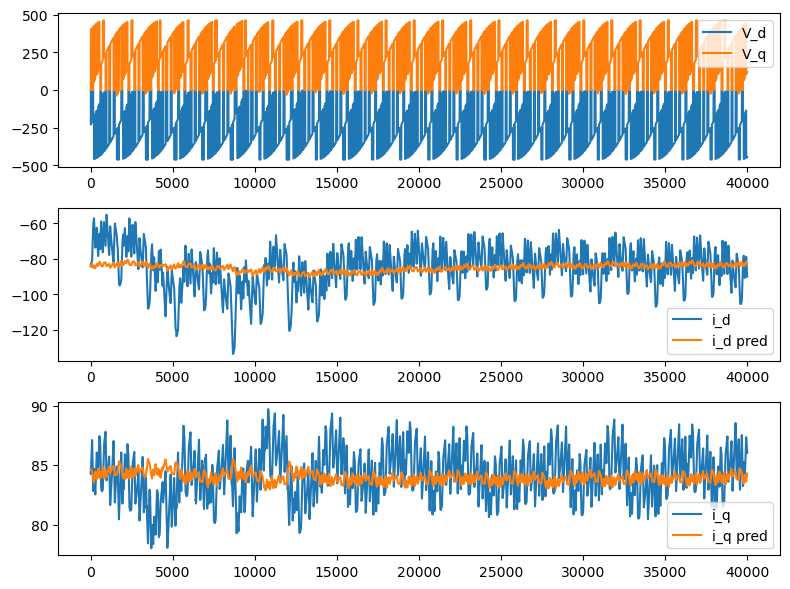

MAE : 10.06735897064209, MSE : 186.102294921875


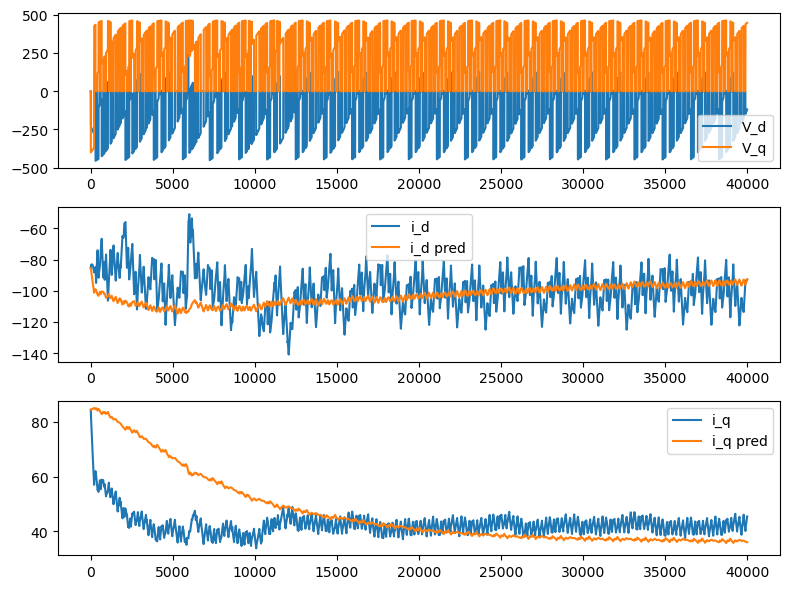

MAE : 11.61247730255127, MSE : 382.2130432128906


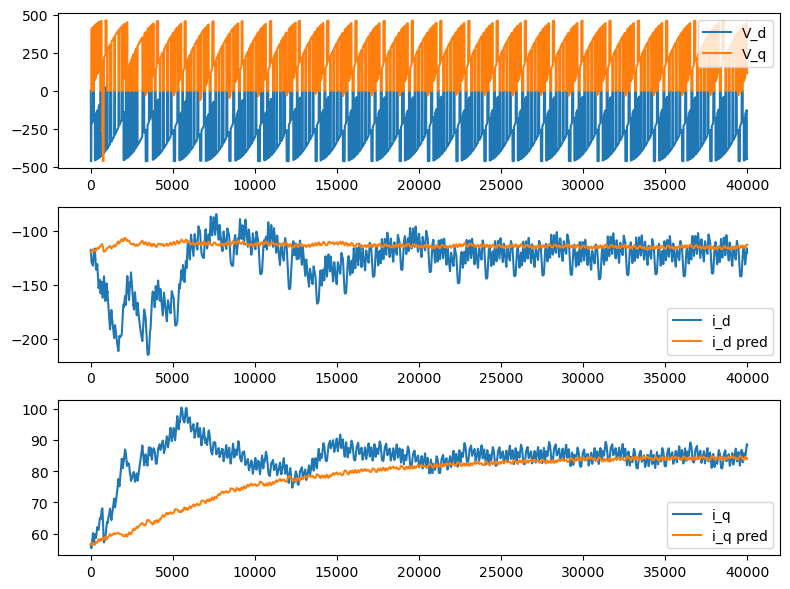

MAE : 5.7794318199157715, MSE : 73.261474609375


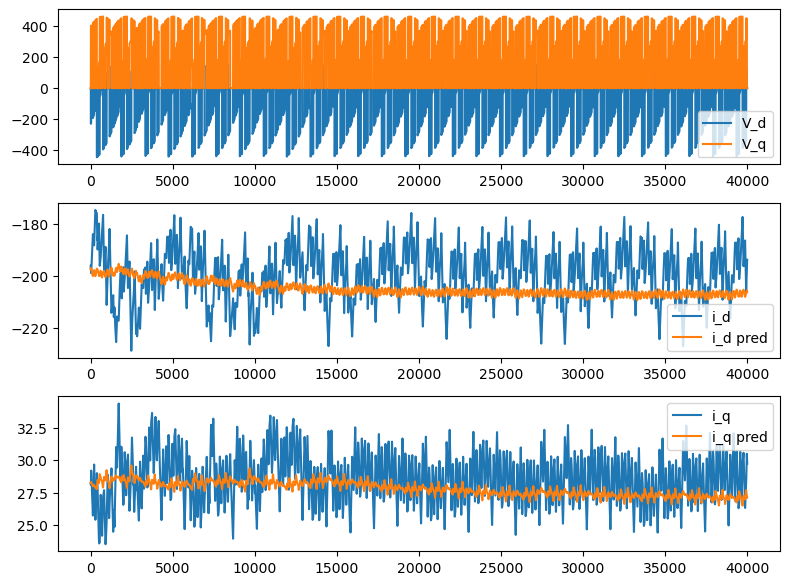

MAE : 16.860530853271484, MSE : 744.1092529296875


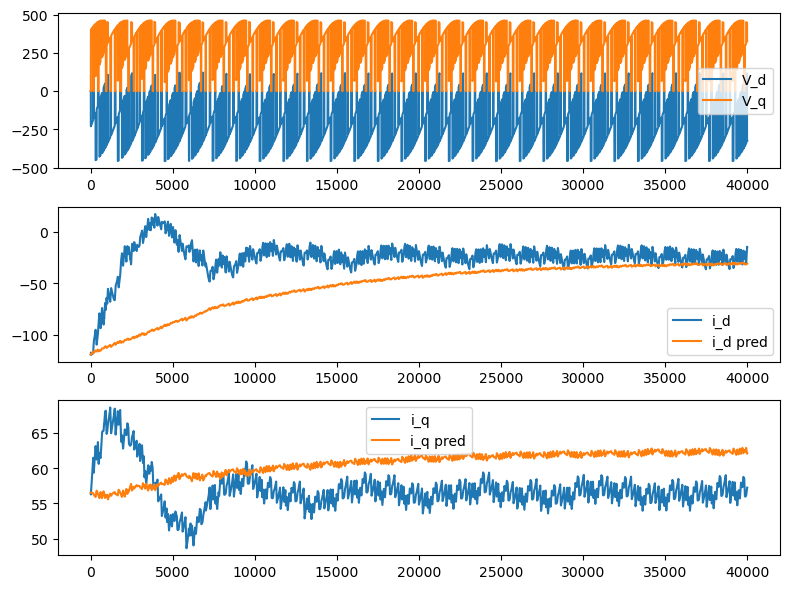

In [38]:
for i in range(len(test_data)//nsim):
    x_test = X_test[i*nsim : (i+1)*nsim]
    y_test = Y_test[i*nsim : (i+1)*nsim]
    
    current_predictions = inference_dynamicmodel(dynamicmodel, x_test, y_test)
    current_predictions = current_predictions.squeeze(0)
    # current_predictions = output_scaler.inverse_transform(current_predictions)
    error_dynamicmodel(current_predictions, y_test)

    plot_predictions(x_test, y_test, current_predictions)
